# **Projet Fil Rouge**
Analyse de données pour la prédiction des valeurs nutritionnelles des fourrages pour ruminants par machine learning et Large Language Models

Auteurs : Raphaël RUBRICE, Raphaël GENIN, Aristide LAURONT, Matéo PETITET

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import itertools
from copy import deepcopy
import matplotlib.pyplot as plt
from scipy.stats import friedmanchisquare
from scikit_posthocs import posthoc_nemenyi_friedman

def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [2]:
fourrage = pd.read_excel("../INRA2018_TablesFourrages_etude_prediction_20241121.xlsx", engine="openpyxl", header = 1)

In [3]:
fourrage.head()

,No,Etat,Code INRA,Libellé 0,Libellé 1,Libellé 2,Libellé 3,Libellé 4,MS,UFL,...,GlyDI,AlaDI,TyrDI,C14:0,C16:0,C16:1,C18:0,C18:1,C18:2,C18:3
0,1,1,FV0010,FOURRAGES VERTS,"PRAIRIES PERMANENTES, PLAINE (NORMANDIE)",1er cycle,"15-25 avril, déprimage, ST = 172°C",NaN,15.5,1.07,...,6.94,6.87,4.13,1.0,15.68,1.4,2.30,4.04,16.34,54.50
1,2,1,FV0020,FOURRAGES VERTS,"PRAIRIES PERMANENTES, PLAINE (NORMANDIE)",1er cycle,"1-10 mai, pâturage, ST = 298°C",NaN,16.6,1.02,...,6.93,6.88,4.14,1.0,16.36,1.4,2.38,4.19,16.89,52.75
2,3,1,FV0030,FOURRAGES VERTS,"PRAIRIES PERMANENTES, PLAINE (NORMANDIE)",1er cycle,"15-25 mai, début épiaison, ST = 470°C",NaN,17.2,0.94,...,6.80,6.87,4.10,1.0,17.46,1.4,2.49,4.41,17.65,49.96
3,4,1,FV0040,FOURRAGES VERTS,"PRAIRIES PERMANENTES, PLAINE (NORMANDIE)",1er cycle,"1-10 juin, épiaison, ST = 685°C",NaN,20.2,0.84,...,6.81,6.88,4.11,1.0,18.22,1.4,2.56,4.54,18.12,48.04
4,5,1,FV0050,FOURRAGES VERTS,"PRAIRIES PERMANENTES, PLAINE (NORMANDIE)",1er cycle,"15-25 juin, floraison, ST = 903°C",NaN,19.2,0.74,...,6.81,6.89,4.12,1.0,18.79,1.4,2.61,4.63,18.46,46.59


# Arangement des colonnes

## Arangement de libellé 1 en 3 sous colonnes (création de deux sous colonnes)

In [4]:
fourrage[["Libellé 1", "Libellé 1-2"]] = fourrage["Libellé 1"].str.split(",", n=1, expand=True)

In [5]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 1') + 1, cols.pop(cols.index('Libellé 1-2')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 2', 'Libellé 3', 'Libellé 4', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 1-2']


In [6]:
fourrage.head()

,No,Etat,Code INRA,Libellé 0,Libellé 1,Libellé 1-2,Libellé 2,Libellé 3,Libellé 4,MS,...,GlyDI,AlaDI,TyrDI,C14:0,C16:0,C16:1,C18:0,C18:1,C18:2,C18:3
0,1,1,FV0010,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),1er cycle,"15-25 avril, déprimage, ST = 172°C",NaN,15.5,...,6.94,6.87,4.13,1.0,15.68,1.4,2.30,4.04,16.34,54.50
1,2,1,FV0020,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),1er cycle,"1-10 mai, pâturage, ST = 298°C",NaN,16.6,...,6.93,6.88,4.14,1.0,16.36,1.4,2.38,4.19,16.89,52.75
2,3,1,FV0030,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),1er cycle,"15-25 mai, début épiaison, ST = 470°C",NaN,17.2,...,6.80,6.87,4.10,1.0,17.46,1.4,2.49,4.41,17.65,49.96
3,4,1,FV0040,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),1er cycle,"1-10 juin, épiaison, ST = 685°C",NaN,20.2,...,6.81,6.88,4.11,1.0,18.22,1.4,2.56,4.54,18.12,48.04
4,5,1,FV0050,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),1er cycle,"15-25 juin, floraison, ST = 903°C",NaN,19.2,...,6.81,6.89,4.12,1.0,18.79,1.4,2.61,4.63,18.46,46.59


In [7]:
fourrage[["Libellé 1-2", "Libellé 1-3"]] = fourrage["Libellé 1-2"].str.split(",", n=1, expand=True)

In [8]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 1-2') + 1, cols.pop(cols.index('Libellé 1-3')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 1-2', 'Libellé 2', 'Libellé 3', 'Libellé 4', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 1-3']


## Arrangement de libellé 2 : split en 3 colonnes

In [9]:
fourrage[["Libellé 2", "Libellé 2-1"]] = fourrage["Libellé 2"].str.split(",", n=1, expand=True)

In [10]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 2') + 1, cols.pop(cols.index('Libellé 2-1')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 1-2', 'Libellé 1-3', 'Libellé 2', 'Libellé 3', 'Libellé 4', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 2-1']


In [11]:
fourrage['Libellé 2-1'].str.contains(',', na=False).any()

True

In [12]:
fourrage[["Libellé 2-1", "Libellé 2-2"]] = fourrage["Libellé 2-1"].str.split(",", n=1, expand=True)

In [13]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 2-1') + 1, cols.pop(cols.index('Libellé 2-2')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 1-2', 'Libellé 1-3', 'Libellé 2', 'Libellé 2-1', 'Libellé 3', 'Libellé 4', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 2-2']


In [14]:
fourrage['Libellé 2-1'].str.contains(',', na=False).any()

False

## Arrangement de libellé 3 : division en 3 colonnes

In [15]:
fourrage['Libellé 3'].str.contains(',', na=False).any()

True

In [16]:
fourrage[["Libellé 3", "Libellé 3-1"]] = fourrage["Libellé 3"].str.split(",", n=1, expand=True)

In [17]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 3') + 1, cols.pop(cols.index('Libellé 3-1')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 1-2', 'Libellé 1-3', 'Libellé 2', 'Libellé 2-1', 'Libellé 2-2', 'Libellé 3', 'Libellé 4', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 3-1']


In [18]:
fourrage['Libellé 3-1'].str.contains(',', na=False).any()

True

In [19]:
fourrage[["Libellé 3-1", "Libellé 3-2"]] = fourrage["Libellé 3-1"].str.split(",", n=1, expand=True)

In [20]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 3-1') + 1, cols.pop(cols.index('Libellé 3-2')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 1-2', 'Libellé 1-3', 'Libellé 2', 'Libellé 2-1', 'Libellé 2-2', 'Libellé 3', 'Libellé 3-1', 'Libellé 4', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 3-2']


In [21]:
fourrage['Libellé 3-1'].str.contains(',', na=False).any()

False

## Arrangement de libellé 4

In [22]:
fourrage['Libellé 4'].str.contains(',', na=False).any()

True

In [23]:
fourrage[["Libellé 4", "Libellé 4-1"]] = fourrage["Libellé 4"].str.split(",", n=1, expand=True)

In [24]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 4') + 1, cols.pop(cols.index('Libellé 4-1')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 1-2', 'Libellé 1-3', 'Libellé 2', 'Libellé 2-1', 'Libellé 2-2', 'Libellé 3', 'Libellé 3-1', 'Libellé 3-2', 'Libellé 4', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 4-1']


In [25]:
fourrage['Libellé 4-1'].str.contains(',', na=False).any()

True

In [26]:
fourrage[["Libellé 4-1", "Libellé 4-2"]] = fourrage["Libellé 4-1"].str.split(",", n=1, expand=True)

In [27]:
cols = fourrage.columns.tolist()
print(cols)
cols.insert(cols.index('Libellé 4-1') + 1, cols.pop(cols.index('Libellé 4-2')))
fourrage = fourrage[cols]

['No', 'Etat', 'Code INRA', 'Libellé 0', 'Libellé 1', 'Libellé 1-2', 'Libellé 1-3', 'Libellé 2', 'Libellé 2-1', 'Libellé 2-2', 'Libellé 3', 'Libellé 3-1', 'Libellé 3-2', 'Libellé 4', 'Libellé 4-1', 'MS', 'UFL', 'UFV', 'PDIA', 'PDI', 'BPR', 'LysDI', 'MetDI', 'HisDI', 'NIref', 'UEM', 'UEL', 'UEB', 'MO', 'MM', 'dMO', 'MAT', 'dMA', 'CB', 'dCB', 'NDF', 'dNDF', 'ADF', 'dADF', 'AG', 'EE', 'P', 'Pabs', 'Ca', 'Caabs', 'Mg', 'BE', 'EB', 'dE', 'EM', 'DT_N', 'DT6_N', 'dr_N', 'S', 'Na', 'K', 'Cl', 'BACA', 'Cu', 'Zn', 'Mn', 'Co', 'Se', 'I', 'VitA', 'VitD', 'VitE', 'LysBP', 'HisBP', 'ArgBP', 'ThrBP', 'ValBP', 'MetBP', 'IleBP', 'LeuBP', 'PheBP', 'AspBP', 'SerBP', 'GluBP', 'ProBP', 'GlyBP', 'AlaBP', 'TyrBP', 'CysTrpBP', 'LysDI.1', 'HisDI.1', 'ArgDI', 'ThrDI', 'ValDI', 'MetDI.1', 'IleDI', 'LeuDI', 'PheDI', 'AspDI', 'SerDI', 'GluDI', 'ProDI', 'GlyDI', 'AlaDI', 'TyrDI', 'C14:0', 'C16:0', 'C16:1', 'C18:0', 'C18:1', 'C18:2', 'C18:3', 'Libellé 4-2']


In [28]:
fourrage['Libellé 4-1'].str.contains(',', na=False).any()

False

## OK : plus de virgule

In [29]:
var_obj = fourrage.drop(["Code INRA"], axis=1).select_dtypes(include="object")

In [30]:
var_obj

,Libellé 0,Libellé 1,Libellé 1-2,Libellé 1-3,Libellé 2,Libellé 2-1,Libellé 2-2,Libellé 3,Libellé 3-1,Libellé 3-2,Libellé 4,Libellé 4-1,Libellé 4-2
0,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,15-25 avril,déprimage,ST = 172°C,NaN,NaN,NaN
1,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,1-10 mai,pâturage,ST = 298°C,NaN,NaN,NaN
2,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,15-25 mai,début épiaison,ST = 470°C,NaN,NaN,NaN
3,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,1-10 juin,épiaison,ST = 685°C,NaN,NaN,NaN
4,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,15-25 juin,floraison,ST = 903°C,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
908,RACINES ET TUBERCULES,Rutabagas,None,None,NaN,NaN,NaN,Rutabagas,None,None,NaN,NaN,NaN
909,RACINES ET TUBERCULES,Topinambour,None,None,NaN,NaN,NaN,Topinambour,None,None,NaN,NaN,NaN
910,RACINES ET TUBERCULES,Feuilles et collets de betteraves,None,None,NaN,NaN,NaN,Feuilles et collets de betteraves propres,None,None,NaN,NaN,NaN
911,RACINES ET TUBERCULES,Feuilles et collets de betteraves,None,None,NaN,NaN,NaN,Feuilles et collets de betteraves sales,None,None,NaN,NaN,NaN


In [31]:
for col in var_obj.columns:
    print('\n\n')
    print(var_obj[col].value_counts())




Libellé 0
ENSILAGES                       307
FOURRAGES VERTS                 294
FOINS                           279
PAILLES, FOURRAGES LIGNIFIÉS     21
RACINES ET TUBERCULES            12
Name: count, dtype: int64



Libellé 1
GRAMINÉES FOURRAGÈRES                502
PRAIRIES PERMANENTES                 147
LÉGUMINEUSES FOURRAGÈRES             147
CÉRÉALES PLANTES ENTIÈRES             44
PROTÉAGINEUX                          17
CRUCIFÈRES                            12
COMPOSÉES                             11
Paille de Blé                          4
Paille d'Orge                          4
Cannes de Maïs                         3
Betteraves Fourragères                 2
Spathes de Maïs                        2
Paille de Sorgho                       2
Paille de Riz                          2
Feuilles et collets de betteraves      2
Topinambour                            1
Rutabagas                              1
Endives                                1
Pommes de terre               

In [32]:
import prince as pr
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

In [33]:
targets = ['UFL', 'UFV', 'PDIA','PDI', 'BPR']
secondary_targets = ['UEM', 'UEL', 'UEB'] + [col for col in fourrage.columns if col[-2:] == 'DI' and col != 'PDI']
features = ['MS', 'MM', 'MAT', 'CB', 'NDF', 'ADF', 'EE']
libelles = [f'Libellé {i}' for i in range(5)]
TARGETS = targets #+ secondary_targets

In [34]:
var_obj.reset_index(drop=True, inplace=True)
var_obj.replace(to_replace=np.nan, value='NA') #Create NA class for missing values

num_obj = fourrage[features]
knn_imp = KNNImputer()
scaler = StandardScaler()
norm_num_obj = pd.DataFrame(scaler.fit_transform(num_obj), columns=num_obj.columns)
noNA_num_obj = pd.DataFrame(knn_imp.fit_transform(norm_num_obj), columns=norm_num_obj.columns) # Impute missing values

noNA_num_obj.reset_index(drop=True, inplace=True)
dataset = pd.concat([var_obj, noNA_num_obj], axis=1)

### **FAMD**

Une méthode permettant de représenter à la fois des données catégorielles et numériques. Voici un livre discutant de différentes méthodes d'analyse de données mixtes [Escofier, B., Pagès, J. (2023). Analyses factorielles simples et multiples - 5e éd.: Cours et études de cas. (n.p.): Dunod.](https://www.google.fr/books/edition/Analyses_factorielles_simples_et_multipl/LzvOEAAAQBAJ?hl=fr&gbpv=0) et [Escofier, B. Traitement simultané de variables qualitatives et quantitatives en analyse factorielle. Les cahiers de l'analyse des données, Tome 4 (1979) no. 2, pp. 137-146.](http://archive.numdam.org/item/CAD_1979__4_2_137_0/)

In [35]:
famd = pr.FAMD(
    n_components=200,
    n_iter=5,
    copy=True,
    check_input=True,
    random_state=42,
    engine="sklearn",
    handle_unknown="error"  # same parameter as sklearn.preprocessing.OneHotEncoder
)
famd = famd.fit(dataset)
famd.plot(
    dataset,
    x_component=0,
    y_component=1,
    show_column_labels=True)

alt.LayerChart(...)

In [36]:
explained_summary = famd.eigenvalues_summary
explained_summary.index = [f'C{i}' for i in range(explained_summary.shape[0])]

In [37]:
def string2num(row):
    return float(row[:-1])

def transform_eigen_format(col):
    new_col = col.apply(string2num)
    return new_col

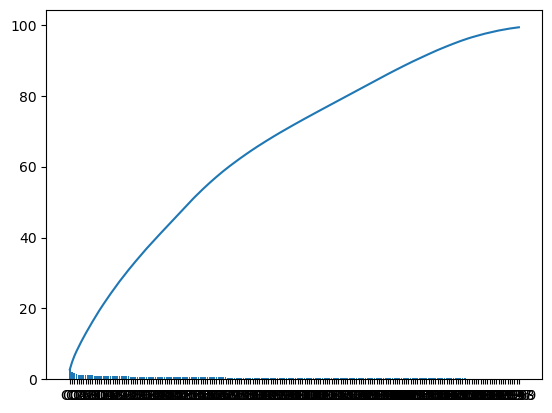

In [38]:
components = list(explained_summary.index)
exp_var = transform_eigen_format(explained_summary['% of variance'])
cum_exp_var = transform_eigen_format(explained_summary['% of variance (cumulative)'])

plt.figure()
plt.bar(components, exp_var)
plt.plot(components, cum_exp_var)
plt.show()

In [39]:
print(cum_exp_var)

C0       2.76
C1       4.83
C2       6.53
C3       7.96
C4       9.26
        ...  
C195    98.98
C196    99.07
C197    99.17
C198    99.25
C199    99.33
Name: % of variance (cumulative), Length: 200, dtype: float64


In [40]:
famd.column_contributions_.style.format('{:.0%}')

component,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
MS,0%,1%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,1%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
MM,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,1%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,1%,0%
MAT,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,1%,0%
CB,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%
NDF,0%,0%,0%,0%,1%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,1%
ADF,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0%,0

In [41]:
famd_dataset = famd.transform(dataset)
famd_dataset.columns = components
famd_dataset.reset_index(drop=True, inplace=True)
to_predict = fourrage[TARGETS]
to_predict.reset_index(drop=True, inplace=True)

famd_dataset = pd.concat([famd_dataset, to_predict], axis=1)
famd_dataset

,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C195,C196,C197,C198,C199,UFL,UFV,PDIA,PDI,BPR
0,5.339768,-9.367524,-1.176605,20.015029,-1.230649,-19.173184,-4.028276,-1.678294,4.458686,-2.507503,...,-0.103501,-0.021019,-0.032057,-0.027569,-0.065522,1.07,1.05,53,107,59
1,5.250439,-8.837946,-1.133424,18.780393,-1.653152,-17.029238,-3.650693,-1.079232,3.402931,-2.203272,...,-0.267020,-0.252470,0.073339,-0.049567,0.056788,1.02,0.99,41,95,26
2,5.221800,-8.485368,-1.182556,18.904111,-2.282198,-16.925105,-3.847464,-0.544385,3.005223,-2.233890,...,-0.320661,-0.333597,0.118380,-0.056767,0.076204,0.94,0.90,32,85,-3
3,5.133113,-8.153466,-1.302484,19.002350,-2.988039,-17.048216,-3.971776,0.100677,2.644912,-2.286776,...,-0.312871,-0.337487,0.126963,-0.063858,0.055271,0.84,0.78,25,77,-17
4,5.095376,-7.977228,-1.399831,19.099765,-3.411958,-17.249455,-4.086737,0.451780,2.494199,-2.294053,...,-0.249017,-0.259362,0.091337,-0.058829,0.013109,0.74,0.66,21,70,-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
908,21.148725,10.362994,-0.966446,2.483524,17.077051,10.365870,-11.815122,-19.256972,2.646956,-11.421923,...,0.028074,-0.019137,0.027183,-0.073848,-0.054131,1.29,1.35,12,77,-43
909,21.191857,10.087866,-0.719099,2.299343,17.440927,10.598539,-11.988968,-19.505993,2.792620,-11.573682,...,0.035836,-0.029003,0.036083,-0.073868,-0.074842,1.17,1.19,10,72,-52
910,20.803134,9.879538,-1.782031,1.590045,16.891349,9.873616,-10.931798,-19.141755,2.539699,-10.683134,...,0.012525,-0.019978,0.014698,-0.138428,-0.029910,0.96,0.96,34,88,18
911,20.825069,9.614093,-2.035291,1.370452,17.164524,9.857954,-10.703292,-19.472191,2.638206,-10.364584,...,-0.009820,-0.023183,0.088846,-0.259177,-0.023008,0.77,0.76,32,80,19


In [42]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import root_mean_squared_error, r2_score, mean_absolute_percentage_error, mean_squared_error, mean_absolute_error, max_error
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR, LinearSVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

In [43]:
def evaluate_model(model, X_train, Y_train, cv=5, scoring='neg_root_mean_squared_error', show=False):
    scores = cross_val_score(model, X_train, Y_train, cv=cv, scoring=scoring)
    scores = [-1*score for score in scores if 'neg' in scoring]
    score = np.mean(scores)
    std = np.std(scores)
    if show:
        print(f"Average Score : {score}")
        print(f"Standard Deviation : {std}")
    return scores, score, std

def evaluate_models(model_dict, data, input_features, targets, cv=5,show=False, scoring='neg_root_mean_squared_error', normalize=True):
    scaler = StandardScaler()
    out = {"Models":[]}
    all_splits_unit = {"Models":[]}
    for split in range(cv):
        all_splits_unit[f'Fold_{split+1}'] = []
    all_splits = {}
    for target in targets:
        out[target] = []
        all_splits[target] = deepcopy(all_splits_unit)
    for model_name in model_dict.keys():
        if show:
            print(f'\nModel : {model_name}')
        model = model_dict[model_name]
        out["Models"].append(model_name)
        for target in targets:
            if show:
                print(f'Results for {target}')
            if normalize:
                norm_data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns, index=data.index)
            else:
                norm_data = data
            X_train, X_test, Y_train, Y_test = train_test_split(norm_data[input_features], norm_data[target], shuffle=True, random_state=62)
            scores, score, std = evaluate_model(model, X_train, Y_train, cv=cv, scoring=scoring, show=show)
            out[target].append(score)
            all_splits[target]["Models"].append(model_name)
            for split in range(cv):
                all_splits[target][f'Fold_{split+1}'].append(scores[split])
    df_mean = pd.DataFrame(out)
    df_mean.index = df_mean['Models']
    stat_df_dico = {}
    for target in targets:
        stat_df_dico[target] = pd.DataFrame(all_splits[target])
        stat_df_dico[target].index = stat_df_dico[target]['Models']
        stat_df_dico[target] = stat_df_dico[target].iloc[:,1:]
    return df_mean.iloc[:,1:], stat_df_dico

def plot_best_model(eval_output, model_dict, data, input_features, targets,
                    method='avg',
                    cv=5, scoring='neg_root_mean_squared_error', direction="min", 
                    normalize=True, 
                    clip_outliers=False, outlier_threshold=2):
    scaler = StandardScaler()

    # Plot best model on average
    if method =='avg':
        if direction == "min":
            model_name = list(eval_output.index)[np.argmin(eval_output[target])]
        if direction == "max":
            model_name = list(eval_output.index)[np.argmax(eval_output[target])]

    for i,target in enumerate(targets):
        # Plot best model for this specific target
        if method =='per_target':
            if direction == "min":
                model_name = list(eval_output.index)[np.argmin(eval_output[target])]
            else:
                model_name = list(eval_output.index)[np.argmax(eval_output[target])]

        model = model_dict[model_name]
        if normalize:
            norm_data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)
        else:
            norm_data = data
        X_train, X_test, Y_train, Y_test = train_test_split(norm_data[input_features], norm_data[target], shuffle=True, random_state=62)
        y_pred = cross_val_predict(model, X_train, Y_train, cv=cv)
        r2 = r2_score(Y_train, y_pred)

        if clip_outliers:
            mean_Error, std_Error = np.mean(np.abs(y_pred-Y_train)), np.std(np.abs(y_pred-Y_train))
            mask = np.where(np.abs(y_pred-Y_train) >= mean_Error + outlier_threshold * std_Error, False, True)
            Y_train, y_pred = Y_train[mask], y_pred[mask]
            n_out = np.sum(mask == False)
        print(f"\n*** Model : {model_name} ***")
        plt.subplots(1,2, sharex=True, figsize=(14,5))
        plt.subplot(1,2,1)
        plt.scatter(Y_train, y_pred, c=np.abs(y_pred-Y_train))
        plt.colorbar(label="| Y_predicted - Y_true |")
        plt.plot(Y_train, Y_train, linestyle='--')
        if clip_outliers:
            plt.title(f'R2 score : {r2} \n{n_out} outliers removed.')
        else:
            plt.title(f'R2 score : {r2}')
        plt.xlabel(f'True {target}')
        plt.ylabel(f'Predicted {target}')
        plt.subplot(1,2,2)
        plt.scatter(Y_train, y_pred-Y_train, c=np.abs(y_pred-Y_train), cmap='flare')
        plt.colorbar(label="| Y_predicted - Y_true |")
        plt.plot(Y_train, [0]*Y_train.shape[0], c='black', linestyle='--')
        if clip_outliers:
            plt.title(f'Plot of residues. \n{n_out} outliers removed.')
        else:
            plt.title(f'Plot of residues.')
        plt.xlabel(f'True {target}')
        plt.ylabel(f'Errors (Y_pred - Y_hat) for {target}')
        plt.show()


In [44]:
model_dico = {"LinearRegression":LinearRegression(n_jobs=1),
        "Ridge":Ridge(),
        "Lasso":Lasso(),
        "ElascticNet":ElasticNet(),
        "LinearSVR":LinearSVR(),
        "NonLinear_SVR":SVR(kernel='rbf'),
        "KNeighborsRegressor":KNeighborsRegressor(),
        "DecisionTreeRegressor":DecisionTreeRegressor(random_state=62),
        "RandomForestRegressor":RandomForestRegressor(random_state=62, n_jobs=1),
        "GradientBoostingRegressor":GradientBoostingRegressor(random_state=62),
        "XGBoostRegressor":XGBRegressor(n_estimators=100, random_state=62),
        "MLPRegressor":MLPRegressor(hidden_layer_sizes=(20,20), alpha=0.01)}

# results_df, stat_df = evaluate_models(model_dico, famd_dataset, list(components), TARGETS, show=False)

In [45]:
# results_df["Average"] = np.mean(results_df, axis=1)
# plt.figure(figsize=(len(TARGETS),6))
# sns.heatmap(results_df.clip(upper=10), annot=True)
# plt.title('Root Mean Squared Error of different models for our targets. (Lower is better)')
# plt.show()

In [46]:
# plot_best_model(results_df, model_dico, famd_dataset, list(components), TARGETS, clip_outliers=False)

In [47]:
enc = OneHotEncoder(sparse_output=False)

OHE_Lib0 = pd.DataFrame(enc.fit_transform(fourrage.iloc[:,3:4]), columns=[t[0] for t in list(fourrage.iloc[:,3:4].value_counts().index)])
OHE_Lib1 = pd.DataFrame(enc.fit_transform(fourrage.iloc[:,4:5]), columns=[t[0] for t in list(fourrage.iloc[:,4:5].value_counts().index)])

In [48]:
dataset_with_OHE_L0 = pd.concat([OHE_Lib0, fourrage[features+TARGETS]], axis=1)
print(dataset_with_OHE_L0.shape)
dataset_with_OHE_L1 = pd.concat([OHE_Lib1, fourrage[features+TARGETS]], axis=1)
print(dataset_with_OHE_L1.shape)
dataset_with_OHE_L0L1 = pd.concat([OHE_Lib0, OHE_Lib1, fourrage[features+TARGETS]], axis=1)
print(dataset_with_OHE_L0L1.shape)

(913, 17)
(913, 39)
(913, 44)


In [49]:
# features_L0 = list(OHE_Lib0.columns) + features
# results_df_L0, stat_df_L0 = evaluate_models(model_dico, dataset_with_OHE_L0, features_L0, TARGETS, show=False, scoring="neg_root_mean_squared_error")

RMSE intéressant ?? Regarder prédiction vs vraies. Comprendre pourquoi NaN ?

In [50]:
# results_df_L0["Average"] = np.mean(results_df_L0, axis=1)
# plt.figure(figsize=(len(TARGETS),6))
# sns.heatmap(results_df_L0, annot=True)
# plt.title('Performance using OneHotEncoded Libellé 0 \n with numerical descriptors using RMSE (Lower is better)')
# plt.show()

In [51]:
# plot_best_model(results_df_L0, model_dico, dataset_with_OHE_L0, features_L0, TARGETS, clip_outliers=False)

In [52]:
# features_L1 = list(OHE_Lib1.columns) + features
# results_df_L1, stat_df_L1 = evaluate_models(model_dico, dataset_with_OHE_L1, features_L1, TARGETS, show=False)

In [53]:
# results_df_L1["Average"] = np.mean(results_df_L1, axis=1)
# plt.figure(figsize=(len(TARGETS),6))
# sns.heatmap(results_df_L1, annot=True)
# plt.title('Performance using OneHotEncoded Libellé 1 \n with numerical descriptors using RMSE (Lower is better)')
# plt.show()

In [54]:
# plot_best_model(results_df_L1, model_dico, dataset_with_OHE_L1, features_L1, TARGETS, clip_outliers=False)

In [55]:
# features_L0L1 = list(OHE_Lib0.columns) + list(OHE_Lib1.columns) + features
# results_df_L0L1, stat_df_L0L1 = evaluate_models(model_dico, dataset_with_OHE_L0L1, features_L0L1, TARGETS, show=False)

In [56]:
# results_df_L0L1["Average"] = np.mean(results_df_L0L1, axis=1)
# plt.figure(figsize=(len(TARGETS),6))
# sns.heatmap(results_df_L0L1, annot=True)
# plt.title('Performance using OneHotEncoded Libellé 0 and Libellé 1 \n with numerical descriptors using RMSE (Lower is better)')
# plt.show()

In [57]:
# plot_best_model(results_df_L0L1, model_dico, dataset_with_OHE_L0L1, features_L0L1, TARGETS, clip_outliers=False)

In [58]:
def study_with_libelle(model_dict, data, targets, categorical_cols, num_cols, step_categorical,
                       cv=5, metric='neg_root_mean_squared_error', normalize=True, metric_name='RMSE'):
    n_cat = len(categorical_cols)
    output = {}
    for target in targets:
        output[target] = {'Model':[], 'N_categorical':[], metric_name:[]}
    for i in range(step_categorical, n_cat, step_categorical):
        cols = categorical_cols[:i]
        if num_cols:
            features = cols + num_cols
        else:
            features = cols
        # print(f'\nEvaluating when using {i} categoricy representing features')
        results_df, _ = evaluate_models(model_dict, data, features, targets, cv=cv, scoring=metric, normalize=normalize)
        for target in targets:
            output[target]['Model'] += list(results_df.index)
            output[target]['N_categorical'] += [i]*results_df.shape[0]
            output[target][metric_name] += list(results_df[target].iloc[:])
    for target in targets:
        output[target] = pd.DataFrame(output[target], columns=output[target].keys())
    return output

def plot_study_with_libelle(output_study, target, model_name, metric_name='RMSE'):
    data = output_study[target]
    data = data[data['Model'] == model_name]
    if np.max(data[metric_name]) > 20*np.min(data[metric_name]):
        data[f'log({metric_name})'] = np.log(data[metric_name])
        sns.barplot(data, x='N_categorical', y=f'log({metric_name})')
    else:
        sns.barplot(data, x='N_categorical', y=metric_name)
    plt.title(f"Performance on {target} depending \n on the number of categorical components we use")
    plt.xticks(rotation=90)
    plt.show()


In [59]:
# model_dict = {"LinearRegression":LinearRegression(n_jobs=-1)}
# metric_name = "RMSE"
# study_output = study_with_libelle(model_dict, famd_dataset, TARGETS, components, None, 5, metric_name=metric_name)

In [60]:
# for target in targets:
#     plot_study_with_libelle(study_output, target, 'LinearRegression', metric_name=metric_name)

# Partie de RG

In [61]:
print(list(fourrage.columns).index('Libellé 1'))

4


In [62]:
features

['MS', 'MM', 'MAT', 'CB', 'NDF', 'ADF', 'EE']

In [63]:
obj_features = fourrage.drop(["Code INRA"], axis=1).select_dtypes(include="object")
target = fourrage[["UFL", "UFV", "PDI", "PDIA","BPR"]]
num_features = fourrage[["MS","MM", "MAT", "CB", "NDF", "ADF", "EE"]]

In [64]:
obj_features.head()

,Libellé 0,Libellé 1,Libellé 1-2,Libellé 1-3,Libellé 2,Libellé 2-1,Libellé 2-2,Libellé 3,Libellé 3-1,Libellé 3-2,Libellé 4,Libellé 4-1,Libellé 4-2
0,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,15-25 avril,déprimage,ST = 172°C,NaN,NaN,NaN
1,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,1-10 mai,pâturage,ST = 298°C,NaN,NaN,NaN
2,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,15-25 mai,début épiaison,ST = 470°C,NaN,NaN,NaN
3,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,1-10 juin,épiaison,ST = 685°C,NaN,NaN,NaN
4,FOURRAGES VERTS,PRAIRIES PERMANENTES,PLAINE (NORMANDIE),None,1er cycle,None,None,15-25 juin,floraison,ST = 903°C,NaN,NaN,NaN


### **MCA (Multi-Component Analysis ou Analyse en Composantes Multiples)**

Méthode de réduction de dimension sur des données catégorielles. Cette méthode est aussi disucté dans les ressources citées précédemment.

In [65]:
# One Hot + mca sur le OneHot + concaténation + séparation de X et Y + return X et Y

def Optimisation_avec_MCA_sans_PCA(nb_colonne_obj, target_features) :
    
    mca_temp = pr.MCA(
        n_components=nb_colonne_obj,
        n_iter=5,
        copy=True,
        check_input=True,
        engine='sklearn',
        random_state=0)
    
    obj_features_temp = obj_features.iloc[:, 0:nb_colonne_obj]
    
    mca_temp.fit(obj_features_temp)
    obj_features_N = mca_temp.transform(obj_features_temp)
    print(obj_features_N.shape)
    
    scaler = StandardScaler()
    num_features_T = pd.DataFrame(scaler.fit_transform(num_features), columns = num_features.columns)
    target_features_T = pd.DataFrame(scaler.fit_transform(target_features), columns = target_features.columns)
    
    df_t = pd.concat([obj_features_N, num_features_T, target_features_T], axis=1)
    
    for col in df_t.columns:
        na_count = df_t[col].isna().sum()  # Nombre de valeurs manquantes dans la colonne
        if na_count > 0:  # Si au moins une valeur manquante
            print(f"Colonne {col} : attention NA ({na_count} valeurs manquantes)")
    
    # df_t = df_t.dropna()
    
    for col in df_t.columns:
        na_count = df_t[col].isna().sum()  # Nombre de valeurs manquantes dans la colonne
        if na_count > 0:  # Si au moins une valeur manquante
            print(f"Colonne {col} : attention encore NA ({na_count} valeurs manquantes)")

    X_temp = df_t.drop(target, axis = 1)
    Y_temp = df_t[target.columns]
    
    print(X_temp.columns)
    print(features)
    X_temp.columns = [str(i) for i in range(obj_features_N.shape[1])] + features # features est une variable globale définie hors de la fonction
    
    return X_temp, Y_temp

In [66]:
# aijca, aijcpja = Optimisation_avec_MCA_sans_PCA(10, target)
# scoring_dict = {'mape':'neg_mean_absolute_percentage_error', 'max_error':'max_error', 'mae':'neg_mean_absolute_error', 'r2':'r2', 'rmse':'neg_root_mean_squared_error'}
# perfs_dict = cross_validate(LinearRegression(), aijca, aijcpja['UFL'], scoring=scoring_dict, cv=5)
# perfs_dict

In [67]:
def MAD(array):
    return np.median(np.abs(array - np.ones(array.shape)*np.median(array)))

In [68]:
# Prend X et Y + séparation train et test + evaluation par chaque modèle + renvoie de plusieurs métriques pour les différents paramètres
scoring_dict = {'mape':'neg_mean_absolute_percentage_error', 
                'max_error':'max_error', 'mae':'neg_mean_absolute_error', 
                'r2':'r2', 'rmse':'neg_root_mean_squared_error'}

def PerfDesModeles(X_t, Y_t, metrique_num = True, graph_affich = True, return_results=True):
    # Définition des cibles
    target = ["UFV", "UFL", "PDI", "PDIA", "BPR"]

    # Liste des modèles à évaluer
    models = [model for model in model_dico.values()]
    
    # Listes pour stocker les métriques globales
    mape_tot, max_error_tot, mae_tot, r2_tot, rmse_tot = [], [], [], [], []

    # Parcours de chaque variable cible
    for tar in target:
        # Extraction de la cible
        Y_t_temp = Y_t[tar]

        # Division des données en ensembles d'entraînement et de test
        X_train, X_test, Y_train, Y_test = train_test_split(
            X_t, Y_t_temp, test_size=0.33, random_state=0, shuffle=True)

        # Conversion des noms de colonnes en chaînes de caractères (si nécessaire)
        X_train.columns = X_train.columns.astype('str')
        X_test.columns = X_test.columns.astype('str')

        # Listes temporaires pour stocker les métriques d'une seule cible
        mape_temp, max_error_temp, mae_temp, r2_temp, rmse_temp = [], [], [], [], []

        # Évaluation de chaque modèle
        for model in models:
            # Entraînement et prédiction
            model.fit(X_train, Y_train)
            perfs_dico = cross_validate(model, X_train, Y_train, 
                           scoring=scoring_dict, cv=5)
            Yhat = model.predict(X_test)

            # Calcul des métriques
            mape_temp.append(-1*np.mean(perfs_dico['test_mape']).round(4))
            max_error_temp.append(np.mean(perfs_dico['test_max_error']).round(4))
            mae_temp.append(-1*np.mean(perfs_dico['test_mae']).round(4))
            r2_temp.append(np.mean(perfs_dico['test_r2']).round(4))
            rmse_temp.append(-1*np.mean(perfs_dico['test_rmse']).round(4))

        # Ajout des résultats pour la cible en cours
        mape_tot.append(mape_temp)
        max_error_tot.append(max_error_temp)
        mae_tot.append(mae_temp)
        r2_tot.append(r2_temp)
        rmse_tot.append(rmse_temp)

    # Noms des modèles pour indexer les DataFrames
    model_names = [model.__class__.__name__ for model in models]

    # Création des DataFrames pour chaque métrique
    mape_df = pd.DataFrame(mape_tot, columns=model_names, index=target).T
    max_error_df = pd.DataFrame(max_error_tot, columns=model_names, index=target).T
    mae_df = pd.DataFrame(mae_tot, columns=model_names, index=target).T
    r2_df = pd.DataFrame(r2_tot, columns=model_names, index=target).T
    rmse_df = pd.DataFrame(rmse_tot, columns=model_names, index=target).T

    # Liste des métriques et leurs titres pour la visualisation
    metriques = [
        (mape_df, "MAPE (Mean Absolute Percentage Error)", 'crest'),
        (max_error_df, "Erreur Maximale", 'crest'),
        (mae_df, "MAE (Mean Absolute Error)", 'crest'),
        (r2_df, "R² (Coefficient de Détermination)", 'flare'),
        (rmse_df, "RMSE (Moindres carrées)", 'crest')
    ]
    # Visualisation des résultats sous forme de heatmaps
    if graph_affich == True :
        for df, title, colormap in metriques:
            plt.figure(figsize=(8, 6))
            sns.heatmap(df, annot=True, cmap=colormap, fmt=".4g")
            plt.title(title)
            plt.show()
        
    if return_results:
        return metriques
    # Return éventuelle des métriques :
    if metrique_num == True :
        return mape_tot

In [69]:
# aijca, aijcpja = Optimisation_avec_MCA_sans_PCA(10, target)
# PerfDesModeles(aijca, aijcpja, metrique_num=False, graph_affich=False)

# Fin partie de RG
# **Construction d'une baseline**
Le but de la suite est de construire des performances de références en termes de prédiction des valeurs d'intérêts à partir de divers algorithmes. Elle servira notamment de repère pour juger les performances des systèmes produis plus tard dans le projet.

In [70]:
directions_dict = {'mape':'min', 
                'max_error':'min', 'mae':'min', 
                'r2':'max', 'rmse':'min'}
def get_best_perf(results, format: str = {'rr', 'rg'}, mode: str = {'avg', 'all'}, metric="rmse"):
    """
    Pour lire les résultats de PerfDesModeles ou de evaluate_models
    """
    dir = directions_dict[metric]
    if format == 'rr':
        pass
    elif format == 'rg':
        metric_results_pos = list(directions_dict.keys()).index(metric)
        results, _, _ = results[metric_results_pos] # recupère le bon dataframe (c.f def PerfDesModeles)
    else:
        raise Exception("Unknown format, please use either rr or rg formats.")
    
    if mode == 'avg':
        avg = np.mean(results, axis=1)
        std = np.std(results, axis=1)
        if dir == 'max':
            best_model = list(results.index)[np.argmax(avg)]
            best_perf = np.max(avg)
            std_perf = std[np.argmax(avg)]
        else:
            best_model = list(results.index)[np.argmin(avg)]
            best_perf = np.min(avg)
            std_perf = std[np.argmin(avg)]
        return best_model, best_perf, std_perf
    elif mode == 'all':
        if dir == 'max':
            best_model = [list(results.index)[np.argmax(results[col])] for col in results.columns]
            best_perf = [np.max(results[col]) for col in results.columns]
        else:
            best_model = [list(results.index)[np.argmin(results[col])] for col in results.columns]
            best_perf = [np.min(results[col]) for col in results.columns]
        return best_model, best_perf


In [71]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler, RobustScaler
def normalise(dataset, cols_to_norm, targets, method="standard"):
    """
    Normalise les colonnes spécifiées par cols_to_norm dans le dataset donné.
    Différentes méthodes de normalisation sont possible.
    """
    scaler_database = {"standard":StandardScaler(), 
                       "minmax":MinMaxScaler(), 
                       "maxabs":MaxAbsScaler(), 
                       "robust":RobustScaler()}
    scaler = scaler_database[method]
    if cols_to_norm == "all": # Si cols_to_norm est mis à "all", on prends tout
        cols_to_norm = list(dataset.columns)
    normed_df = pd.DataFrame(scaler.fit_transform(dataset[cols_to_norm]), columns=dataset[cols_to_norm].columns, index=dataset.index)
    
    if set(cols_to_norm) == set(list(dataset.columns)):
        return normed_df
    elif set(targets).intersection(set(cols_to_norm)) == set():
        return pd.concat([dataset[[col for col in dataset.columns if col not in targets and col not in cols_to_norm]],
                        normed_df,
                        dataset[targets]], axis=1)
    elif set(targets).intersection(set(cols_to_norm)) == set(targets):
        return pd.concat([dataset[[col for col in dataset.columns if col not in targets and col not in cols_to_norm]],
                        normed_df], axis=1)
    else:
        return pd.concat([dataset[[col for col in dataset.columns if col not in targets and col not in cols_to_norm]],
                        normed_df,
                        dataset[[col for col in targets if col not in cols_to_norm]]], axis=1)
ran_cell = 0

**Normalisons les targets :**

In [72]:
target = normalise(target, TARGETS, TARGETS)
target

,UFL,UFV,PDIA,PDI,BPR
0,2.008158,1.980477,2.453506,2.499307,1.398722
1,1.594213,1.562337,1.319925,1.511949,0.421899
2,0.931899,0.935128,0.469739,0.689150,-0.436521
3,0.104008,0.098848,-0.191517,0.030911,-0.850931
4,-0.723884,-0.737431,-0.569377,-0.545048,-1.117337
...,...,...,...,...,...
908,3.829520,4.071175,-1.419563,0.030911,-1.620549
909,2.836050,2.956136,-1.608494,-0.380488,-1.886955
910,1.097478,1.353267,0.658669,0.935990,0.185093
911,-0.475516,-0.040532,0.469739,0.277751,0.214694


In [73]:
# to_predict = normalise(to_predict, TARGETS, TARGETS)
# to_predict

## Definition datasets 
**ATTENTION, NE LANCER LA CELLULE SUIVANTE QU'UNE FOIS**

In [74]:
if ran_cell == 0:
    num_only = dataset_with_OHE_L0[features+TARGETS]
    num_only = normalise(num_only, features+TARGETS, TARGETS) # On normalise par StandardScaler()

    L0_only = dataset_with_OHE_L0[[col for col in dataset_with_OHE_L0.columns if col not in features]]
    L0_only = normalise(L0_only, TARGETS, TARGETS) # Normalise les outputs
    L1_only = dataset_with_OHE_L1[[col for col in dataset_with_OHE_L1.columns if col not in features]]
    L1_only = normalise(L1_only, TARGETS, TARGETS)
    L0L1_only = dataset_with_OHE_L0L1[[col for col in dataset_with_OHE_L0L1.columns if col not in features]]
    L0L1_only = normalise(L0L1_only, TARGETS, TARGETS)

    dataset_with_OHE_L0 = normalise(dataset_with_OHE_L0, features+TARGETS, TARGETS)
    dataset_with_OHE_L1 = normalise(dataset_with_OHE_L1, features+TARGETS, TARGETS)
    dataset_with_OHE_L0L1 = normalise(dataset_with_OHE_L0L1, features+TARGETS, TARGETS)

    famd5_dataset = pd.concat([famd_dataset.iloc[:,:5], to_predict], axis=1)
    famd5_dataset = normalise(famd5_dataset, TARGETS, TARGETS)

    famd30_dataset = pd.concat([famd_dataset.iloc[:,:30], to_predict], axis=1)
    famd30_dataset = normalise(famd30_dataset, TARGETS, TARGETS)

    # Les dataframes suivant sont déjà normalisés par StandardScaler()
    MCAL0_X, MCAL0_Y = Optimisation_avec_MCA_sans_PCA(1, target)
    # MCAL0 = pd.concat([MCAL0_X, MCAL0_Y], axis=1)
    MCAL0L1_X, MCAL0L1_Y = Optimisation_avec_MCA_sans_PCA(2, target)
    # MCAL0L1 = pd.concat([MCAL0L1_X, MCAL0L1_Y], axis=1)
    MCA_all_X, MCA_all_Y = Optimisation_avec_MCA_sans_PCA(13, target)
    # MCA_all = pd.concat([MCA_all_X, MCA_all_Y], axis=1)

    dataset_dico = {'Valeurs chimiques (VC) uniquement':num_only,
                    'Libellé 0 (L0) uniquement':L0_only,
                    'Libellé 1 (L1) uniquement':L1_only,
                    'L0 et L1 uniquement':L0L1_only,
                    'L0 + VC':dataset_with_OHE_L0,
                    'L1 + VC':dataset_with_OHE_L1,
                    'L0 + L1 + VC':dataset_with_OHE_L0L1,
                    'FAMD 5':famd5_dataset,
                    'FAMD 30':famd30_dataset,
                    'MCA sur L0 + VC':(MCAL0_X, MCAL0_Y),
                    'MCA sur L0 et L1 + VC':(MCAL0L1_X, MCAL0L1_Y),
                    'MCA sur tous les Libellés + VC':(MCA_all_X, MCA_all_Y),
                    }
    ran_cell = 1
else:
    # Pour éviter de réitérer sur les mêmes datasets et de les modifier de manière erronée, on lève une erreur si on a deja lancée la cellule
    raise Exception("ATTENTION t'as déjà lacer la cellule !!")

(913, 1)
Colonne ADF : attention NA (3 valeurs manquantes)
Colonne EE : attention NA (1 valeurs manquantes)
Colonne ADF : attention encore NA (3 valeurs manquantes)
Colonne EE : attention encore NA (1 valeurs manquantes)
Index([0, 'MS', 'MM', 'MAT', 'CB', 'NDF', 'ADF', 'EE'], dtype='object')
['MS', 'MM', 'MAT', 'CB', 'NDF', 'ADF', 'EE']
(913, 2)
Colonne ADF : attention NA (3 valeurs manquantes)
Colonne EE : attention NA (1 valeurs manquantes)
Colonne ADF : attention encore NA (3 valeurs manquantes)
Colonne EE : attention encore NA (1 valeurs manquantes)
Index([0, 1, 'MS', 'MM', 'MAT', 'CB', 'NDF', 'ADF', 'EE'], dtype='object')
['MS', 'MM', 'MAT', 'CB', 'NDF', 'ADF', 'EE']


(913, 13)
Colonne ADF : attention NA (3 valeurs manquantes)
Colonne EE : attention NA (1 valeurs manquantes)
Colonne ADF : attention encore NA (3 valeurs manquantes)
Colonne EE : attention encore NA (1 valeurs manquantes)
Index([    0,     1,     2,     3,     4,     5,     6,     7,     8,     9,
          10,    11,    12,  'MS',  'MM', 'MAT',  'CB', 'NDF', 'ADF',  'EE'],
      dtype='object')
['MS', 'MM', 'MAT', 'CB', 'NDF', 'ADF', 'EE']


**Pour regarder les dimensions des différents datasets et vérifier la cohérence des dimensions.**

In [75]:
for dataset_name, dataset in dataset_dico.items():
    if "MCA" in dataset_name:
        print(f"{dataset_name}:", dataset[0].shape)
    else:
        print(f"{dataset_name}:",dataset.shape)

Valeurs chimiques (VC) uniquement: (913, 12)
Libellé 0 (L0) uniquement: (913, 10)
Libellé 1 (L1) uniquement: (913, 32)
L0 et L1 uniquement: (913, 37)
L0 + VC: (913, 17)
L1 + VC: (913, 39)
L0 + L1 + VC: (913, 44)
FAMD 5: (913, 10)
FAMD 30: (913, 35)
MCA sur L0 + VC: (913, 8)
MCA sur L0 et L1 + VC: (913, 9)
MCA sur tous les Libellés + VC: (913, 20)


In [76]:
# baseline_campaign = {'Method':[],
#                      "best_model":[],
#                      "best_perf":[],
#                      "std":[]}
# METRIC = "rmse"
# in_features = features.copy()
# for dataset in dataset_dico.keys():
#     baseline_campaign["Method"].append(dataset)
#     if 'tuple' in str(type(dataset_dico[dataset])):
#         X, Y = dataset_dico[dataset]
#         results = PerfDesModeles(X, Y, graph_affich=False, return_results=True)
#         best_model, best_perf, std_perf = get_best_perf(results, format='rg', mode="avg", metric=METRIC)
#     else:
#         in_features = list([col for col in dataset_dico[dataset].columns if col not in TARGETS])
#         results, _ = evaluate_models(model_dico, dataset_dico[dataset], in_features, TARGETS)
#         best_model, best_perf, std_perf = get_best_perf(results, format='rr', mode="avg", metric=METRIC)
#     baseline_campaign["best_model"].append(best_model)
#     baseline_campaign["best_perf"].append(best_perf)
#     baseline_campaign["std"].append(std_perf)

In [77]:
# baseline_campaign_df = pd.DataFrame(baseline_campaign, columns=baseline_campaign.keys())

# read_help = "(Lower is Better)" if directions_dict[METRIC] == "min" else "(Bigger is Better)"

# colors = ["cyan"]*baseline_campaign_df.shape[0]
# colors[np.argmin(baseline_campaign_df["best_perf"])] = "green"
# sns.barplot(baseline_campaign_df, x="best_perf", y="Method", orient="h", hue="best_perf", palette="crest")

# plt.errorbar(x = baseline_campaign_df["best_perf"], y = baseline_campaign_df["Method"],
#             xerr=baseline_campaign_df['std'], fmt='none', c= 'black', capsize = 2)
# plt.title(f"Résulats de la campagne de formation du baseline.\nMeilleur = {baseline_campaign_df["Method"][np.argmin(baseline_campaign_df["best_perf"])]}")
# plt.xlabel(f"{METRIC}".upper() + read_help)
# plt.savefig("baseline_campaign.pdf", format="pdf", bbox_inches="tight")
# plt.show()

**On remplace les valeurs manquantes des libéllés par une classe indiquant l'absence de valeurs. Ceci est fait en supposant que l'absence d'information pour un libellé présente aussi un certain intérêt.**

In [78]:
obj_features = obj_features.where(~pd.isna(obj_features), "NA")
obj_features = obj_features.where(~pd.isnull(obj_features), "NA")

In [79]:
# import concurrent.futures
# import os
# from functools import partial

# def parallel_for(func, iterable, max_workers=None):
#     """
#     Exécute une fonction en parallèle sur un iterable, un fold = un CPU.

#     Args:
#         func (callable): La fonction à exécuter pour chaque élément.
#         iterable (iterable): Les éléments sur lesquels exécuter la fonction.
#         max_workers (int): Le nombre maximal de workers à utiliser. (égal au nombre de folds)

#     Returns:
#         list: Une liste des résultats de chaque itération.
#     """
#     # Nombre de workers égal au nombre de folds
#     max_workers = max_workers or len(iterable)

#     results = []
#     with concurrent.futures.ProcessPoolExecutor(max_workers=max_workers) as executor:
#         futures = [executor.submit(func, item) for item in iterable]
#         for future in concurrent.futures.as_completed(futures):
#             results.append(future.result())
#     return results



## **Campagne Baseline**

Dans la suite, on définit un ensemble de fonctions pour évaluer différents algorithmes sur chaque dataset en implémentant un protocole de validation croisée. 

In [80]:
import random as rd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer, SimpleImputer, IterativeImputer
from tqdm import tqdm
from copy import deepcopy

def make_folds(n_obs, cv, shuffle, random_state):
    """
    Produit des indices pour assurer une cross validation.
    Sortie : Liste de tuple. Un tuple = (train_idx, test_idx)
    """
    population = [i for i in range(n_obs)]
    if shuffle:
        rd.seed(random_state)
        population = rd.sample(population, len(population))

    test_length = int(n_obs / cv)
    Folds = []
    for i in range(cv):
        start = i * test_length
        end = start + test_length
        test = population[start:end] if i != cv-1 else population[start:]
        train = [idx for idx in population if idx not in test]
        Folds.append((train, test))
    return Folds

def process_fold(fold, model, X, Y, targets, dataset_name):
    """
    Entraine un modèle sur un fold de la validation croisée pour chaque valeur
    à prédire spécifiées par targets.
    Sortie : Dictionnaire de listes, chaque liste = prédiction du modèle entrainé.
    """
    train_idx, test_idx = fold
    fold_results = {target + "_" + dataset_name: [] for target in targets}

    for target in targets:
        model.fit(X.loc[train_idx], Y[target].loc[train_idx])
        yhat = model.predict(X.loc[test_idx])
        fold_results[target + "_" + dataset_name] += list(yhat)
        # print("PREDICTED:", yhat)
        # print("TRUE:", Y[target].iloc[test_idx])
    return fold_results

# def process_fold_wrapper(fold, model, X, Y, targets, dataset_name):
#     result = process_fold(fold, model, X, Y, targets, dataset_name)
#     # print(f"Résultat du fold : {len(list(result.values())[0])}")
#     return result

def cross_validation(model, dataset, dataset_name, in_features, targets, folds, imputer="knn", return_ytrue=False):
    """
    Implémentation de cross_validation. On peut spécifier une méthode d'imputation des valeurs manquantes.
    """
    imp_dict = {'mean': SimpleImputer(strategy='mean'),
                'median':SimpleImputer(strategy='median'),
                'most_frequent':SimpleImputer(strategy='most_frequent'),
                'knn': KNNImputer(),
                'multivariate':IterativeImputer()}
    imputer = imp_dict[imputer]
    X, Y = dataset[in_features], dataset[targets]

    # On remplace les valeurs manquantes
    X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns, index=X.index)
    assert X.index.equals(Y.index), "Les indices de X et Y ne sont pas alignés après l'imputation !"

    results = {target + "_" + dataset_name: [] for target in targets}
    # if set(features).intersection(set(list(X.columns))) != set():
    #     print(X[features])
    # if hasattr(model, 'n_jobs') and parallel:
    #     model.n_jobs = 1
    # # Exécution en parallèle ou en séquentiel
    # if parallel:
    #     fold_results_list = parallel_for(
    #         partial(process_fold_wrapper, model=deepcopy(model), X=X, Y=Y, targets=targets, dataset_name=dataset_name),
    #         folds, max_workers=len(folds))  # Chaque fold utilise un processus distinct
    # else:

    fold_results_list = [process_fold(fold, model, X, Y, targets, dataset_name) for fold in folds]


    # Fusion des résultats de tous les folds
    for fold_result in fold_results_list:
        for key in fold_result:
            results[key] += fold_result[key]
    if return_ytrue:
        ytrue = [Y.iloc[fold[1]] for fold in folds]
        ytrue = pd.concat(ytrue, axis=0)
        return results, ytrue
    return results

def make_baseline(model_dict, dataset_dict, targets, cv=5, shuffle=True, random_state=62, parallel=False):
    """
    Fonction qui applique la validation croisée pour chaque algorithme dans model_dict, et ce sur tous
    les datasets de dataset_dict. 
    Sortie : Dictionnaire contenant les valeurs prédites par les modèles, Les vraies valeurs, les libellés.
    """
    results_all = {model_name:None for model_name in model_dict.keys()}

    n_obs = dataset_dict[list(dataset_dict.keys())[0]].shape[0] #Nombre d'observations
    FOLDS = make_folds(n_obs, cv, shuffle, random_state)

    # On récupère l'odre des observations après shuffle
    final_order = []
    for train, test in FOLDS:
        final_order += test

    infos_fourrages = obj_features.iloc[final_order,:] # defini hors fonction, plus haut dans le notebok
    results_all["infos_fourrages"] = infos_fourrages
    results_all["targets"] = target.iloc[final_order,:] # defini hors fonction, plus haut dans le notebok
    results_all["database_libelles"] = {col:np.unique(infos_fourrages[col]) for col in infos_fourrages.columns}

    pbar = tqdm(model_dict.keys())
    for model_name in pbar:
        pbar.set_postfix({"Model": model_name})
        pbar.set_description(f"Evaluating {model_name}.. ")
        pbar.refresh()
        
        model = model_dict[model_name]

        # On initialise les résultats avec le premier dataset
        first_dataset_name = list(dataset_dict.keys())[0]
        first_dataset = dataset_dict[first_dataset_name]
        in_features = [col for col in first_dataset.columns if col not in targets]

        results_datasets = cross_validation(model, 
                                            first_dataset, first_dataset_name, 
                                            in_features, 
                                            targets,
                                            FOLDS)
        
        # On fait la cross validation sur chacun des datasets restants
        for dataset_name in list(dataset_dict.keys())[1:]:
            if "MCA" in dataset_name : 
                X, Y = dataset_dict[dataset_name]
                dataset = pd.concat([X, Y], axis=1)
            else:
                dataset = dataset_dict[dataset_name]
            in_features = [col for col in dataset.columns if col not in targets]
            results_one_dataset = cross_validation(model, 
                                            dataset, dataset_name, 
                                            in_features, 
                                            targets,
                                            FOLDS)
            KEYS = list(results_one_dataset.keys())
            # On stocke les nouvelles valeurs dans l'objet initialisé plus haut
            for key in KEYS:
                results_datasets[key] = results_one_dataset[key]
        results_df = pd.DataFrame(results_datasets, columns=results_datasets.keys(), index=final_order)
        results_all[model_name] = results_df
    return results_all

In [81]:
# test_folds = make_folds(dataset_with_OHE_L0L1.shape[0], 5, True, 62)
# test_cross_val, y_true = cross_validation(RandomForestRegressor(random_state=62, n_jobs=-1), 
#                                     dataset_with_OHE_L0L1, "L0 + L1 + VC", 
#                                     [col for col in dataset_with_OHE_L0L1.columns if col not in TARGETS], 
#                                     TARGETS,
#                                     test_folds,
#                                     return_ytrue=True)
# print(r2_score(y_true["UFL"], test_cross_val["UFL_L0 + L1 + VC"]))

In [82]:
# final_order = []
# for train, test in test_folds:
#     final_order += test
# print(np.allclose(target.iloc[final_order,0], y_true["UFL"]))

Définissons notre campagne d'expérience

In [83]:
model_dico = {"LinearRegression":LinearRegression(n_jobs=1),
        "Ridge":Ridge(),
        "Lasso":Lasso(),
        "ElascticNet":ElasticNet(),
        "LinearSVR":LinearSVR(),
        "NonLinear_SVR":SVR(kernel='rbf'),
        "KNeighborsRegressor":KNeighborsRegressor(),
        "DecisionTreeRegressor":DecisionTreeRegressor(random_state=62),
        "RandomForestRegressor":RandomForestRegressor(random_state=62, n_jobs=1),
        "GradientBoostingRegressor":GradientBoostingRegressor(random_state=62),
        "XGBoostRegressor":XGBRegressor(n_estimators=100, random_state=62),
        "MLPRegressor":MLPRegressor(hidden_layer_sizes=(20,20), alpha=0.01)}

### Execution de la campagne

In [84]:
baseline_results = make_baseline(model_dico, dataset_dico, TARGETS)

Evaluating LinearRegression.. :   0%|          | 0/12 [00:00<?, ?it/s, Model=LinearRegression]

Evaluating MLPRegressor.. : 100%|██████████| 12/12 [12:59<00:00, 65.00s/it, Model=MLPRegressor]                          


**Les fonctions qui suivent servent à chercher dans la structure donnée sortie par make_baseline afin de pouvoir chercher des informations de maière très modulaire.**

In [85]:

import plotly.express as px
import plotly.graph_objects as go

def query_results(results, mode, libelle, target, metric, datasets=None, models=None):
    """
    Fonction qui récupère l'information voulue depuis les résulats de make_baseline.
    Deux modes : 'best_perfs' = Trouver les meilleures performances sur chaque dataset
    'libelle_impact' = Voir l'impact des infos textuelles sur les performances pour un 
    type de fourrage donné
    Sortie : DataFrame des résultats de la recherche, Le masque utilisé pour trouver les infos
    """
    metric_dict = {'mape':mean_absolute_percentage_error, 
                'max_error':max_error, 'mae':mean_absolute_error, 
                'r2':r2_score, 'rmse':root_mean_squared_error}
    directions_dict = {'mape':'min', 
                'max_error':'min', 'mae':'min', 
                'r2':'max', 'rmse':'min'}
    
    dir = directions_dict[metric] # Si la metrique est à minimiser ou maximiser.
    metric = metric_dict[metric]

    if libelle != "all":
        libelle_col = None
        for i,LIBELLE in enumerate(results["database_libelles"].keys()):
            if libelle in results["database_libelles"][LIBELLE]:
                libelle_col = i
                break
        if libelle_col == None:
            raise Exception("Le libellé spécifié n'est pas dans la base de données.")
        
        query_mask = results["infos_fourrages"].index[results["infos_fourrages"].iloc[:,libelle_col] == libelle]
        query_infos_fourrages = results["infos_fourrages"].loc[query_mask,:]
    else:
        libelle_col = [i for i in range(len(results["database_libelles"].keys()))] # Recupérer tous les indices
        query_mask = results["infos_fourrages"].index
        query_infos_fourrages = results["infos_fourrages"]

    query_results = {"Dataset":[], 
                     "Performance":[], 
                     "Ecart-Type (Erreurs modeles)":[], 
                     "IQR (Erreurs modeles)":[], 
                     "MAD (Erreurs modeles)":[],
                     "Modeles":[]}
    if not datasets:
        datasets = []
        for col in results[list(results.keys())[0]].columns:
            if col[col.index("_")+1:] not in datasets:
                datasets.append(col[col.index("_")+1:])
    if not models:
        models = [model for model in results.keys() if model not in ['infos_fourrages', 'targets', 'database_libelles']]

    for model in models:
        query_values = results[model].loc[query_mask]
        target_results_col = [col for col in query_values.columns if f"{target}_" in col]
        
        #On filtre la query pour récupérer seulement les resultats qu'on veut
        target_results_col = [col for col in target_results_col if col[col.index("_")+1:] in datasets]

        # Calculer les performances du model sur chaque dataset
        perfs = [metric(results["targets"][target].loc[query_mask], query_values[col]) for col in target_results_col]

        # Calculer l'ecart type des erreurs du modèle
        abs_errors = [np.abs(query_values[col] - results["targets"][target].loc[query_mask]) for col in target_results_col]
        std = [np.std(abs_errors[i]) for i in range(len(abs_errors)) ]
        
        iqr = [np.percentile(abs_errors[i], 75) - np.percentile(abs_errors[i], 25) for i in range(len(abs_errors))]
        mad = [MAD(abs_errors[i]) for i in range(len(abs_errors))]
        
        query_results["Dataset"] += datasets
        query_results["Performance"] += perfs
        query_results["Ecart-Type (Erreurs modeles)"] += std
        query_results["IQR (Erreurs modeles)"] += iqr
        query_results["MAD (Erreurs modeles)"] += mad
        query_results["Modeles"] += [model] * len(perfs)
    query_results = pd.DataFrame(query_results, columns=query_results.keys())

    if mode == "best_perfs":
        idx_list = []
        for dataset in datasets:
            temp_df = query_results.loc[query_results["Dataset"] == dataset, :]
            if dir == 'min':
                idx = list(temp_df.loc[temp_df["Performance"] == np.min(temp_df["Performance"])].index)[0]
            else:
                idx = list(temp_df.loc[temp_df["Performance"] == np.max(temp_df["Performance"])].index)[0]
            idx_list.append(idx)
    elif mode == "libelle_impact":
        assert libelle != "all", "En mode libelle_impact, il faut spécifier un libellé, peu importe son niveau de précision."
        idx_list = []
        for dataset in ["Valeurs chimiques (VC) uniquement","L0 + VC", "L1 + VC", "L0 + L1 + VC"]:
            temp_df = query_results.loc[query_results["Dataset"] == dataset, :]
            if dir == 'min':
                idx = list(temp_df.loc[temp_df["Performance"] == np.min(temp_df["Performance"])].index)[0]
            else:
                idx = list(temp_df.loc[temp_df["Performance"] == np.max(temp_df["Performance"])].index)[0]
            idx_list.append(idx)
    else:
        raise Exception("Deux modes possibles uniquement : 'best_perfs' ou 'libelle_impact'.")
    return query_results.iloc[idx_list], query_mask
        
def plot_query(results, mode, libelle, target, metric, save=False, clip_outliers=False, outlier_threshold=2, show_bars=False, errbars_type="mad"):
    """
    Affiche les informations souhaitées en utilisant query_results afin de les récupérer.
    Trois modes possibles : 'see_best_predictions' = Affiche Pred vs True et plot des résidus pour le meilleur modèle.
    'best_perfs' = Montre les meilleures performances sur chaque dataset
    'libelle_impact' = Montre l'impact des infos textuelles (non réduites en dimension) sur les performances
    """
    if mode == "see_best_predictions":
        mode_query = "best_perfs"
    else:
        mode_query = mode
    query_out, query_mask = query_results(results, mode_query, libelle, target, metric)
    read_help = "(Lower is Better)" if directions_dict[metric] == "min" else "(Bigger is Better)"

    if mode == "best_perfs":
        func = np.argmin if directions_dict[metric] == "min" else np.argmax
        sns.barplot(query_out, x="Performance", y="Dataset", orient="h", hue="Performance", palette="crest")
        if libelle == "all":
            libelle = "de tous types"
        if show_bars:
            if errbars_type == "mad":
                err_variability_metric = 'MAD (Erreurs modeles)'
            elif errbars_type == "iqr":
                err_variability_metric = 'IQR (Erreurs modeles)'
            else:
                err_variability_metric = 'Ecart-Type (Erreurs modeles)'
            plt.errorbar(x = query_out["Performance"], y = query_out["Dataset"],
                        xerr=query_out[err_variability_metric], fmt='none', c= 'black', capsize = 2)
            plt.title(f"Meilleures performances sur les fourrages {libelle} pour les valeurs {target}.\nMeilleur = {query_out["Dataset"].iloc[func(query_out["Performance"])]}\nBarres d'erreurs : {err_variability_metric}")
        else:
            plt.title(f"Meilleures performances sur les fourrages {libelle} pour les valeurs {target}.\nMeilleur = {query_out["Dataset"].iloc[func(query_out["Performance"])]}")
        plt.xlabel(f"{metric} ".upper() + read_help)

    elif mode == "see_best_predictions":
        func = np.argmin if directions_dict[metric] == "min" else np.argmax
        best_idx = func(query_out["Performance"])
        best_method = query_out["Dataset"].iloc[best_idx]
        model_name = query_out["Modeles"].iloc[best_idx]
        best_perf = query_out["Performance"].iloc[best_idx]

        y_pred = results[model_name][f"{target}_{best_method}"].loc[query_mask]
        Y_true = results["targets"][target].loc[query_mask]
        infos_fourrages = results["infos_fourrages"].loc[query_mask].squeeze()
        mean_Error, std_Error = np.mean(np.abs(y_pred - Y_true)), np.std(np.abs(y_pred - Y_true))

        if clip_outliers:
            mask = np.abs(y_pred - Y_true) < mean_Error + outlier_threshold * std_Error
            Y_true, y_pred = Y_true[mask], y_pred[mask]
            n_out = np.sum(~mask)

        r2 = r2_score(Y_true, y_pred)

        # Create scatter plot for predictions vs true values
        fig1 = px.scatter(
            x=Y_true,
            y=y_pred,
            color=np.abs(y_pred - Y_true),
            color_continuous_scale='viridis',
            title=f'Meilleur Modèle pour prédire {target}: {model_name}<br>Dataset:{best_method}<br>{metric.upper()} score: {best_perf:.4f}, R² score: {r2:.4f}',
            labels={"x": f"True {target}", "y": f"Predicted {target}", "color": "|Y_pred - Y_true|"},
            hover_data={"True Value": Y_true, "Predicted Value": y_pred, "Libellé 0": infos_fourrages["Libellé 0"], "Libellé 1": infos_fourrages["Libellé 1"]}
        )
        fig1.update_layout(width=640, height=480)

        fig1.add_trace(go.Scatter(x=Y_true, y=Y_true, mode='lines', line=dict(dash='dash'), showlegend=False))

        # Create scatter plot for residuals
        fig2 = px.scatter(
            x=Y_true,
            y=y_pred - Y_true,
            color=np.abs(y_pred - Y_true),
            color_continuous_scale='darkmint',
            title=f'Plot des Résidus.<br>Ecart-type = {std_Error:.4f}, Erreur Absolue Moyenne = {mean_Error:.4f}',
            labels={"x": f"True {target}", "y": f"Errors (Y_pred - Y_true)"},
            hover_data={"True Value": Y_true, "Error": y_pred - Y_true, "Libellé 0": infos_fourrages["Libellé 0"], "Libellé 1": infos_fourrages["Libellé 1"]}
        )
        fig2.update_layout(width=640, height=480)
        fig2.add_hline(y=0, line_dash="dash", line_color="black")

        fig1.show()
        fig2.show()

    else:
        query_out["Impact"] = query_out["Performance"] - float(query_out["Performance"].loc[query_out["Dataset"] == "Valeurs chimiques (VC) uniquement"])
        sns.barplot(query_out, y="Dataset", x="Impact", orient="h", hue="Impact", palette="crest")
        plt.title(f"Impact de l'ajout des libellés pour les fourrages de type {libelle} pour les valeurs {target}.")
        plt.xticks(rotation=75)
        plt.axvline(0, c='grey', linestyle="--")
        plt.xlabel(f"{metric} ".upper() + read_help)
    if save:
        plt.savefig(f"query_{mode}_{libelle}_{target}_{metric}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

# **Résultats Baseline**
**Voyons quels sont les meilleurs résultats pour chaque valeurs à prédires :**

PS : Vous pouvez passer au dessus des points pour avoir des informations supplémentaires comme le Libellé 0 et 1.

In [86]:
for target in TARGETS:
    print(target)
    plot_query(baseline_results, "see_best_predictions", "all", target, "mae", clip_outliers=False)

UFL


UFV


PDIA


PDI


BPR


**Trois algorithmes se démarquent donc, XGBoostRegressor, NonLinear_SVR et GradientBoostingRegressor. Il faut noter que le premier et le dernier sont en réalité deux implémentation différentes du même algorithme. Le NonLinear_SVR correspond à un Séparateur à Vaste Marge avec noyau RBF**  

**Voyons les résultats de la campagne : Sur quel dataset a t on montré la meilleure performance ?**

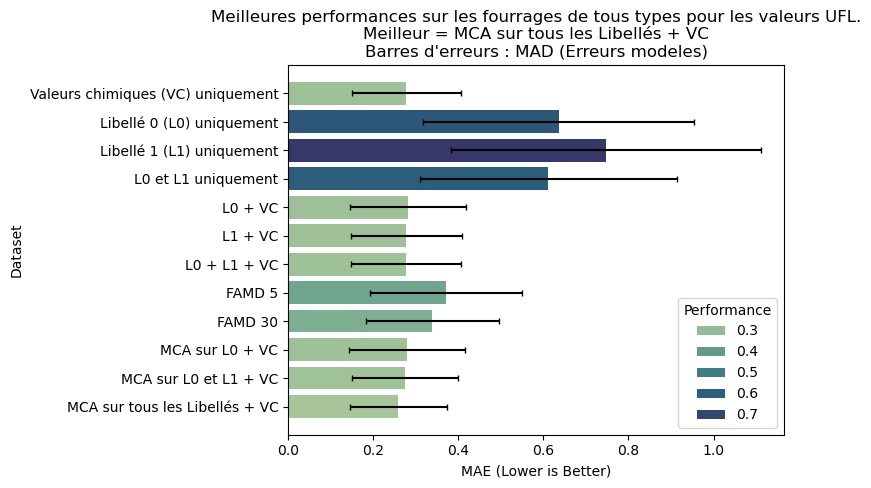

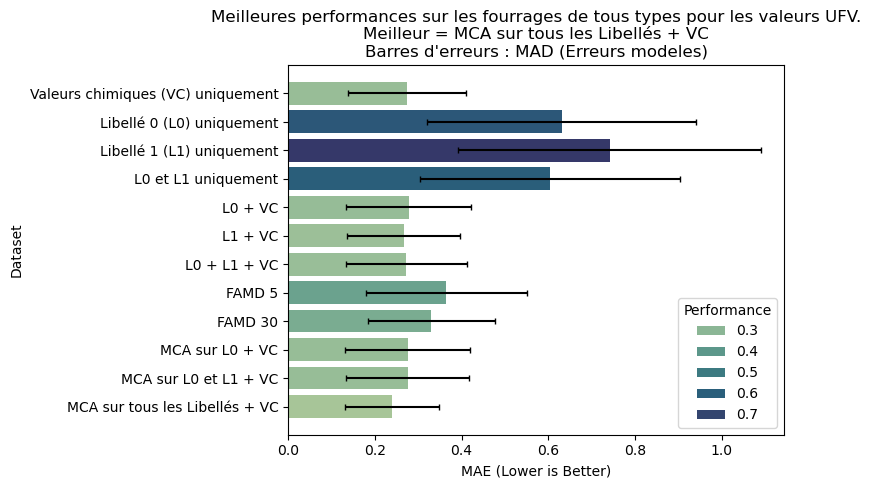

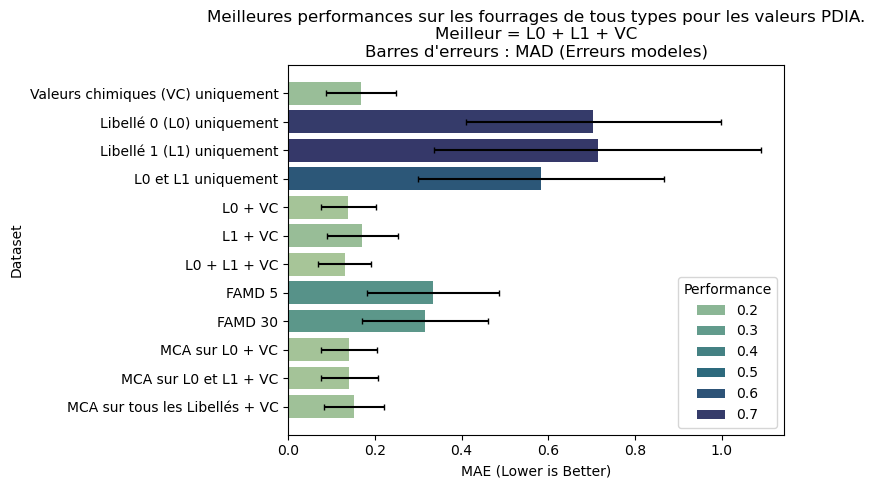

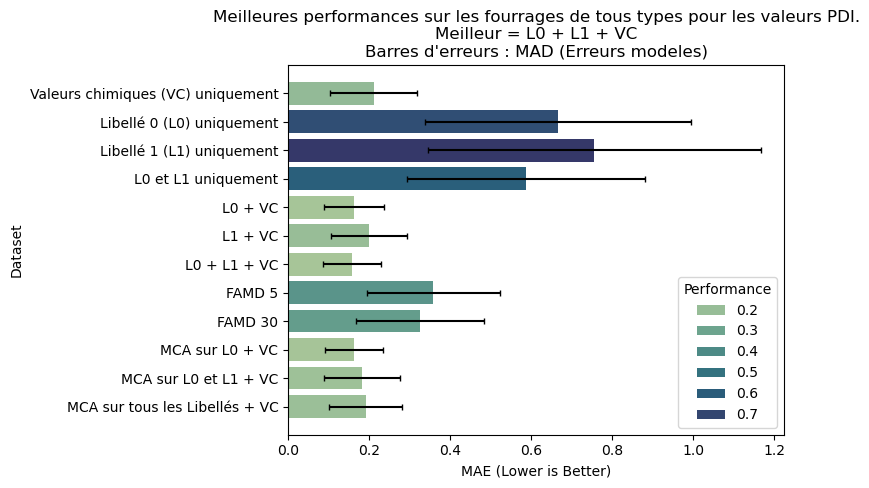

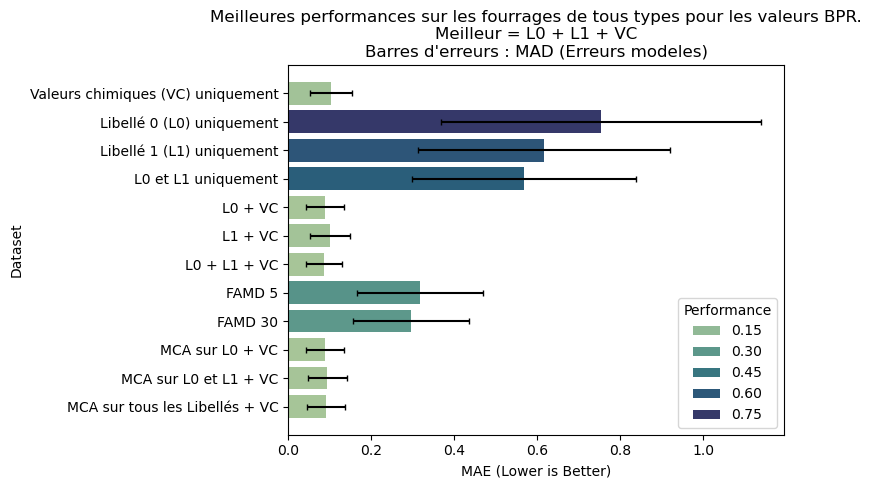

In [87]:
for target in TARGETS:
    plot_query(baseline_results, "best_perfs", "all", target, "mae", save=False, show_bars=True)

**Heatmap L0 + L1 + VC et MCA + VC**

In [ ]:
candidats = {key:model_dico[key] for key in ["NonLinear_SVR", 'XGBoostRegressor', "GradientBoostingRegressor"]}
results_noMCA = []
results_MCA = []

n_obs = dataset_dico[list(dataset_dico.keys())[0]].shape[0]
FOLDS = make_folds(n_obs, 5, True, 62)

for model_name, model in candidats.items():
    # L0 + L1 + VC
    dataset = dataset_dico["L0 + L1 + VC"]

    in_features = [col for col in dataset.columns if col not in targets]
    results_one_dataset, y_true = cross_validation(model, 
                                    dataset, "L0 + L1 + VC", 
                                    in_features, 
                                    TARGETS,
                                    FOLDS,
                                    return_ytrue=True)
    print(results_one_dataset.keys())
    dico = {"Model":[model_name]}
    for target in TARGETS:
        dico[target] = [mean_absolute_error(y_true[target], results_one_dataset[target + "_L0 + L1 + VC"])]

    dico["Avg"] = np.mean([dico[target][0] for target in TARGETS])
    dico["STD"] = np.std([dico[target][0] for target in TARGETS])

    results_noMCA.append(pd.DataFrame(dico, columns=list(dico.keys())))

    # MCA sur tous les libelles + VC
    X, Y = dataset_dico["MCA sur tous les Libellés + VC"]
    dataset = pd.concat([X, Y], axis=1)

    in_features = [col for col in dataset.columns if col not in targets]
    results_one_dataset, y_true = cross_validation(model, 
                                    dataset, "MCA sur tous les Libellés + VC", 
                                    in_features, 
                                    TARGETS,
                                    FOLDS,
                                    return_ytrue=True)
    
    dico = {"Model":[model_name]}
    for target in TARGETS:
        dico[target] = [mean_absolute_error(y_true[target], results_one_dataset[target + "_MCA sur tous les Libellés + VC"])]

    dico["Avg"] = np.mean([dico[target][0] for target in TARGETS])
    dico["STD"] = np.std([dico[target][0] for target in TARGETS])

    results_MCA.append(pd.DataFrame(dico, columns=list(dico.keys())))

df_noMCA = pd.concat(results_noMCA, axis=0)
df_noMCA.index = df_noMCA["Model"]
df_noMCA = df_noMCA[[col for col in df_noMCA.columns if col != 'Model']]

df_MCA = pd.concat(results_MCA, axis=0)
df_MCA.index = df_MCA["Model"]
df_MCA = df_MCA[[col for col in df_MCA.columns if col != 'Model']]

dict_keys(['UFL_L0 + L1 + VC', 'UFV_L0 + L1 + VC', 'PDIA_L0 + L1 + VC', 'PDI_L0 + L1 + VC', 'BPR_L0 + L1 + VC'])
dict_keys(['UFL_L0 + L1 + VC', 'UFV_L0 + L1 + VC', 'PDIA_L0 + L1 + VC', 'PDI_L0 + L1 + VC', 'BPR_L0 + L1 + VC'])
dict_keys(['UFL_L0 + L1 + VC', 'UFV_L0 + L1 + VC', 'PDIA_L0 + L1 + VC', 'PDI_L0 + L1 + VC', 'BPR_L0 + L1 + VC'])


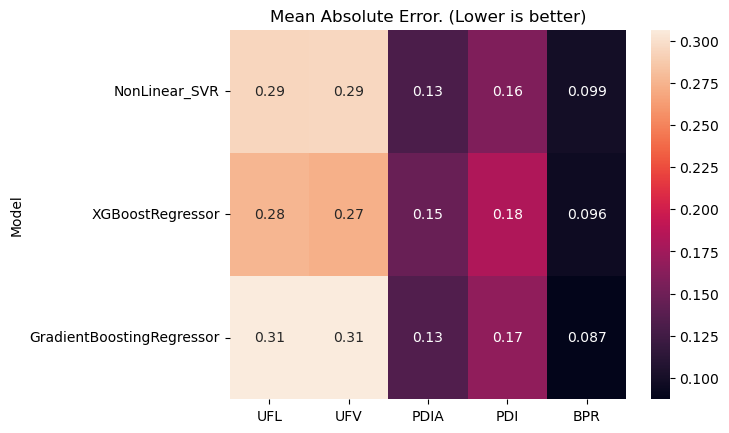

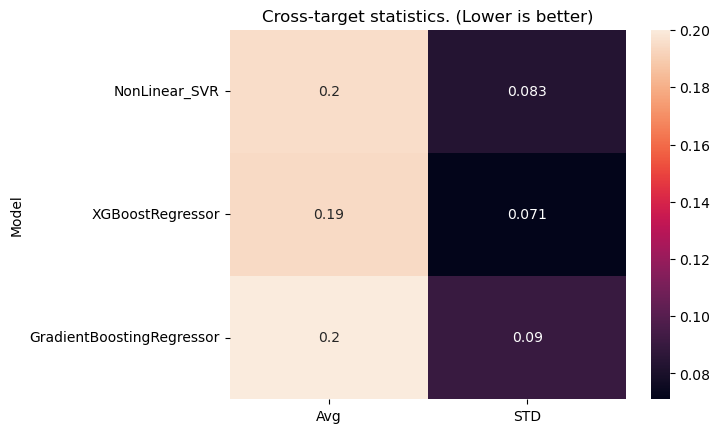

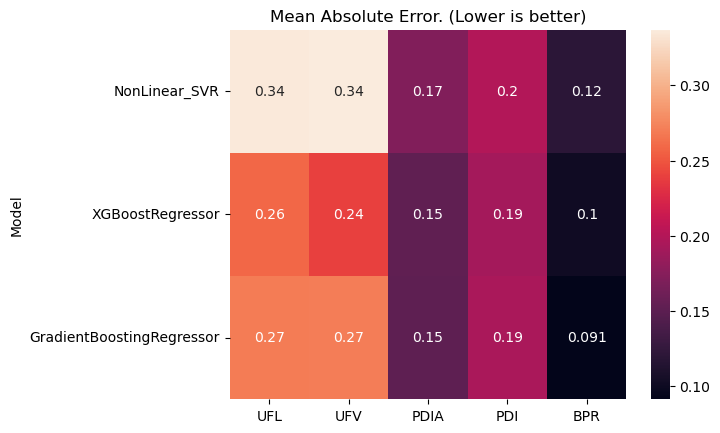

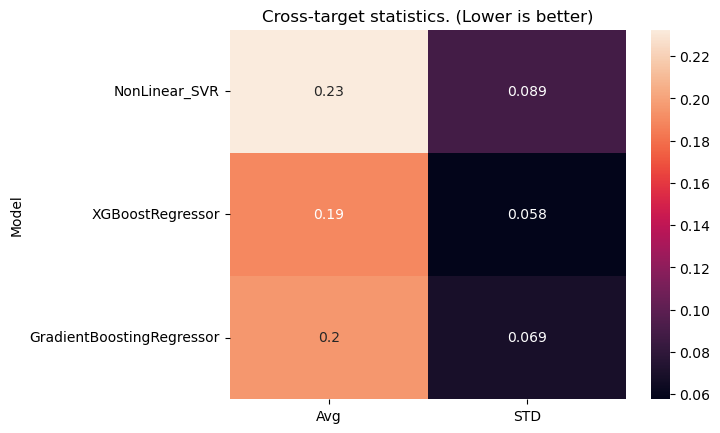

In [103]:
# Plot L0 + L1 + VC Heatmap
# plt.figure(figsize=(len(TARGETS),6))
sns.heatmap(df_noMCA.iloc[:,:-2], annot=True, cmap="rocket")
plt.title('Mean Absolute Error. (Lower is better)')
plt.savefig("./best_ML_noMCA_targets.pdf", format='pdf', bbox_inches='tight')
plt.show()

sns.heatmap(df_noMCA.iloc[:,-2:], annot=True, cmap="rocket")
plt.title('Cross-target statistics. (Lower is better)')
plt.savefig("./best_ML_noMCA_overall.pdf", format='pdf', bbox_inches='tight')
plt.show()

# Plot MCA sur tous les libellés + VC
# plt.figure(figsize=(len(TARGETS),6))
sns.heatmap(df_MCA.iloc[:,:-2], annot=True, cmap="rocket")
plt.title('Mean Absolute Error. (Lower is better)')
plt.savefig("./best_ML_MCA_targets.pdf", format='pdf', bbox_inches='tight')
plt.show()

sns.heatmap(df_MCA.iloc[:,-2:], annot=True, cmap="rocket")
plt.title('Cross-target statistics. (Lower is better)')
plt.savefig("./best_ML_MCA_overall.pdf", format='pdf', bbox_inches='tight')
plt.show()

**Ainsi on conclut que les meilleurs datasets sont : One Hot Encoding des Libellés 0 et 1 + Valeurs chimiques, MCA sur tous les Libellés + Valeurs chimiques. De manière intéressante, le premier dataset est le meilleur pour les valeurs protéiques, tandis que le second l'est pour les valeurs énergétiques. Le niveau de performance est meilleur sur les valeurs protéiques.**

**Regardons comment, pour chaque grand type de fourrage (Libellé 0), les meilleures performances évolues en prenant les informations textuelles en plus des valeurs chimiques.**

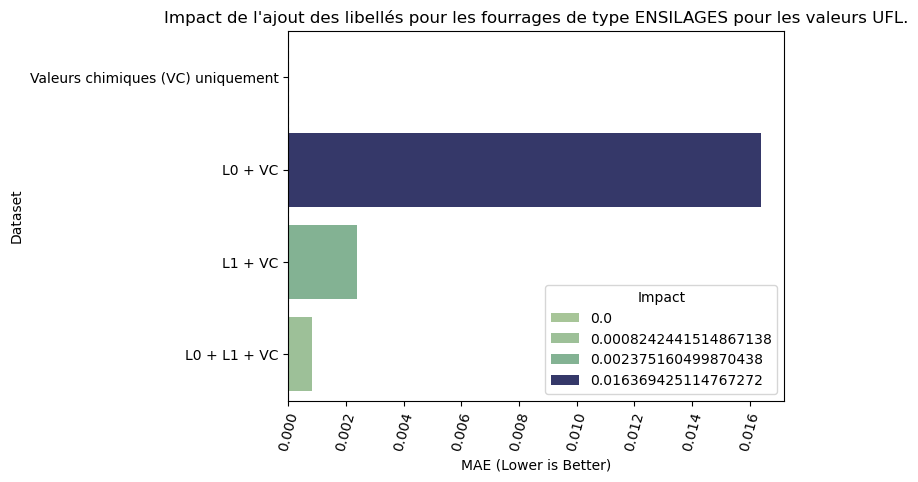

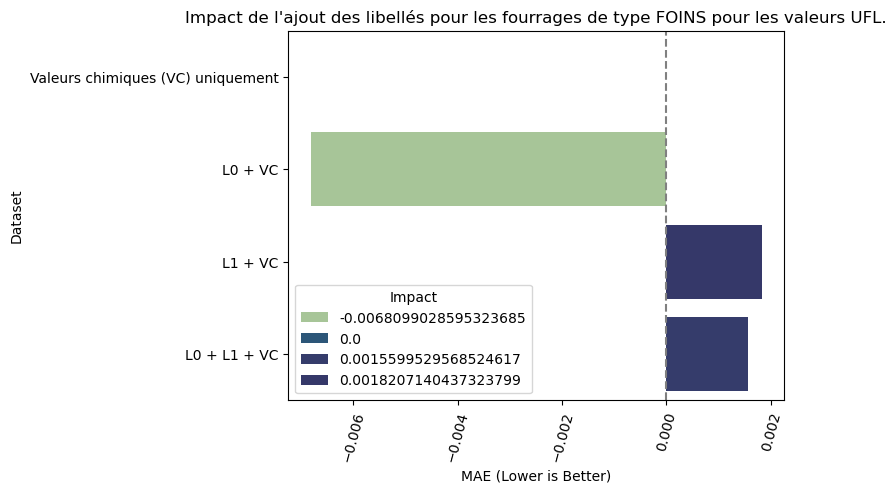

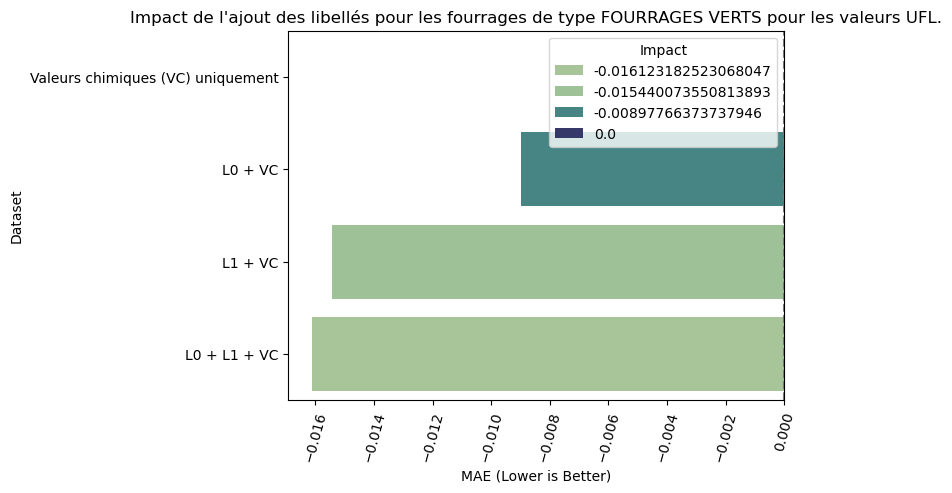

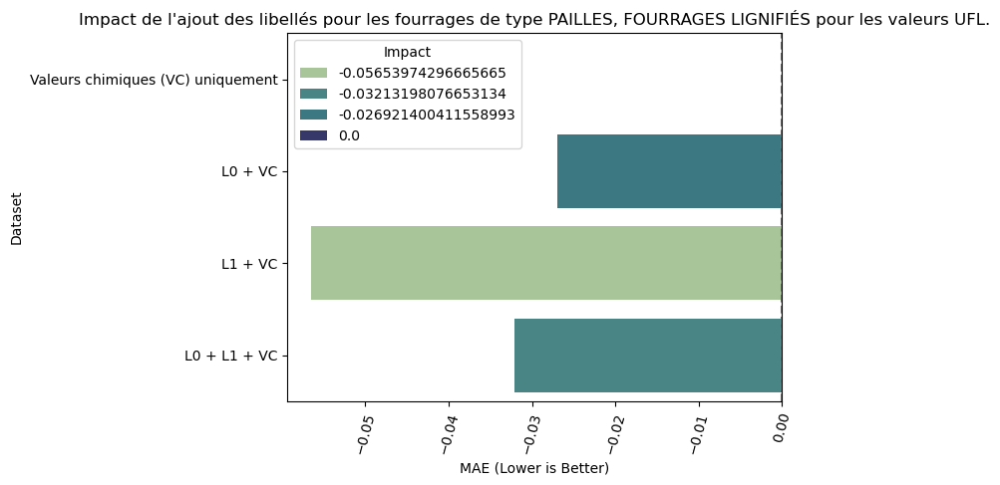

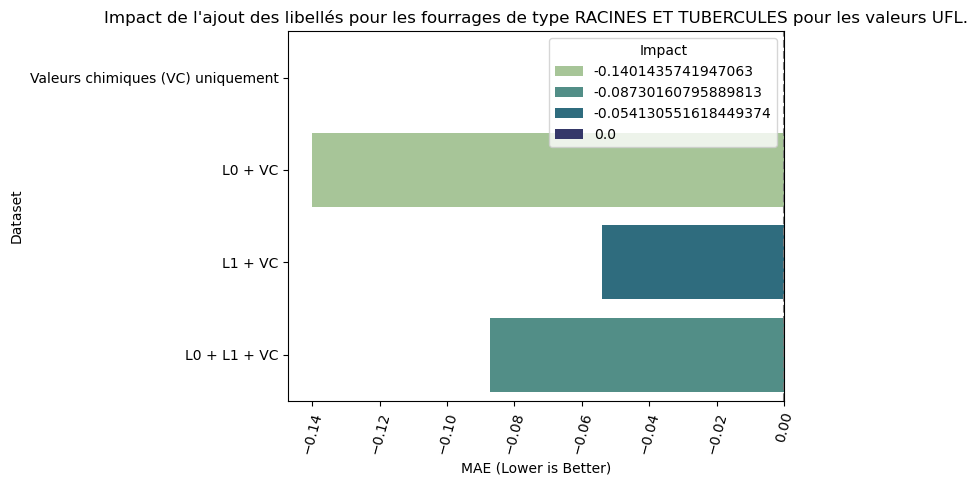

In [ ]:
for libelle in np.unique(obj_features["Libellé 0"]):
    plot_query(baseline_results, "libelle_impact", libelle, "UFL", "mae", save=False)

**Les changements sont minimes, pour les valeurs UFL. Ceci implique qu'a priori, les informations textuelles, SOUS CETTE FORME, n'aident quasiment pas pour améliorer les performances. Qu'en est il des autres valeurs à prédire ?**

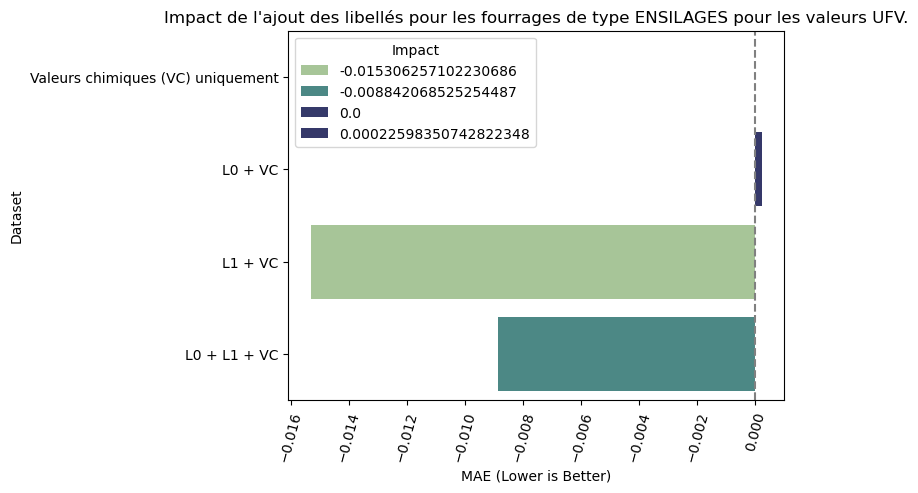

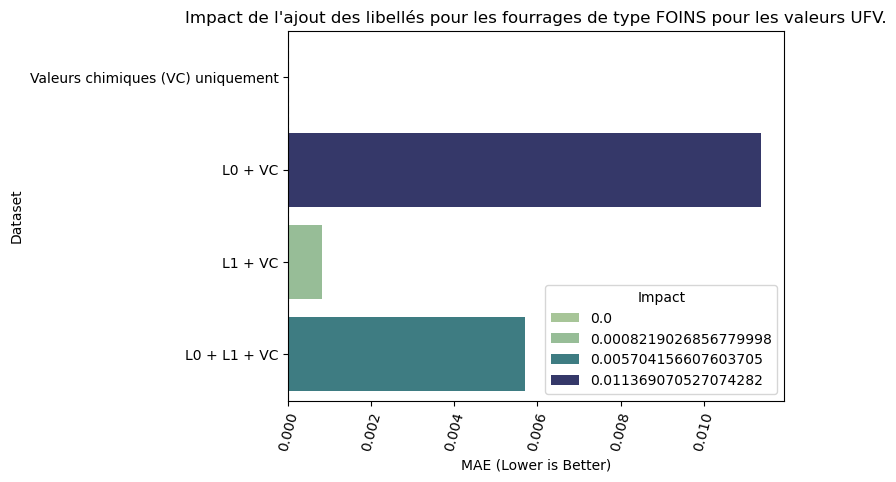

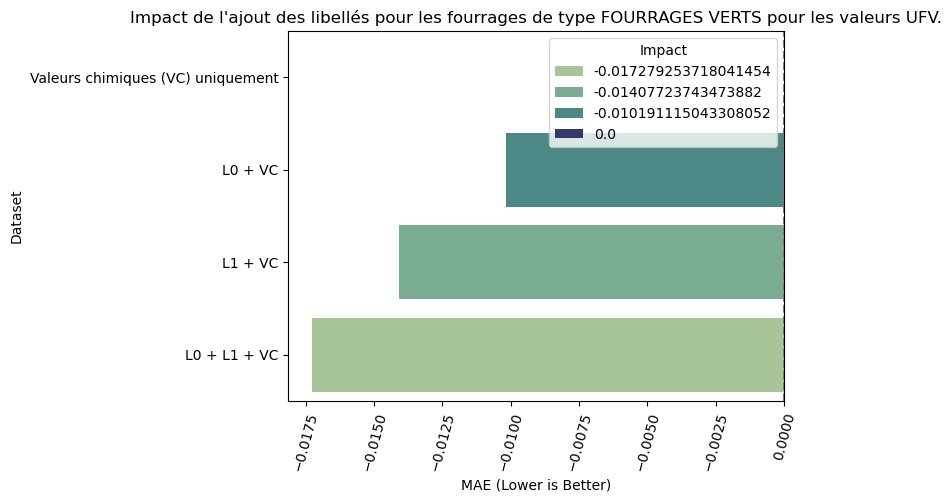

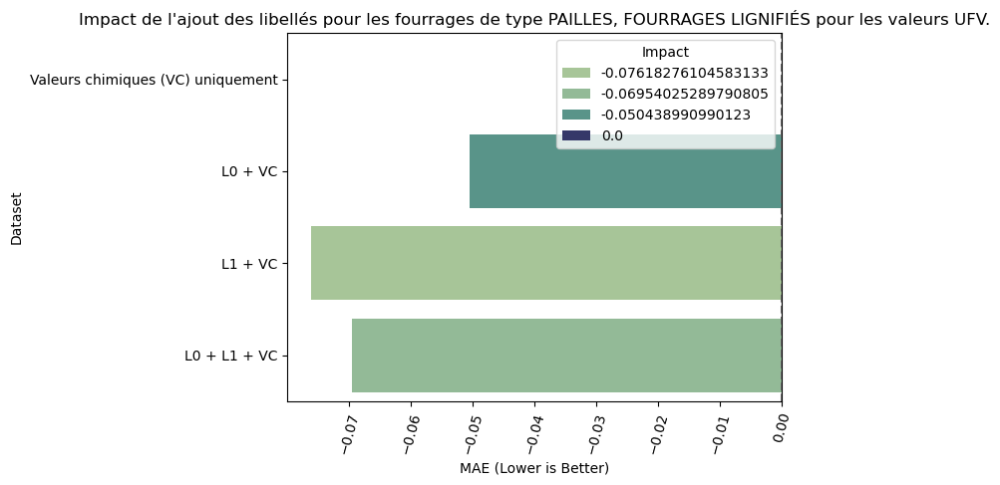

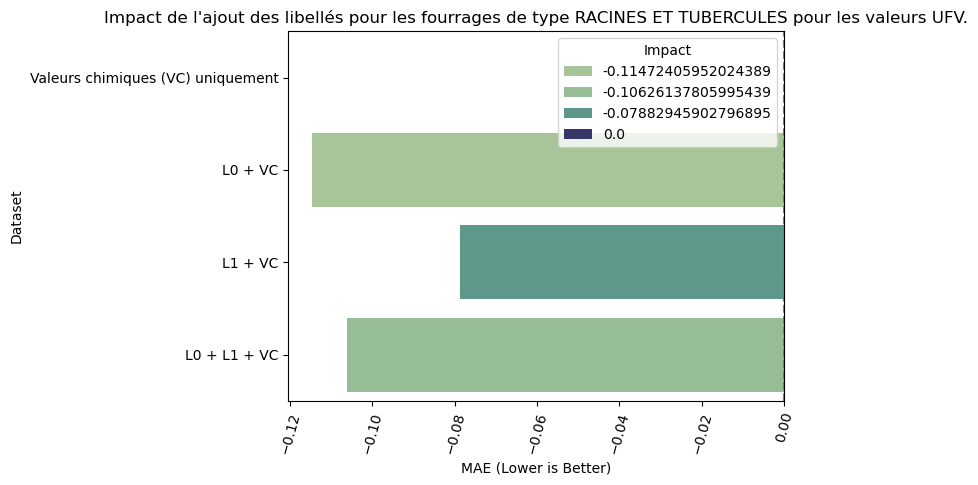

In [ ]:
for libelle in np.unique(obj_features["Libellé 0"]):
    plot_query(baseline_results, "libelle_impact", libelle, "UFV", "mae", save=False)

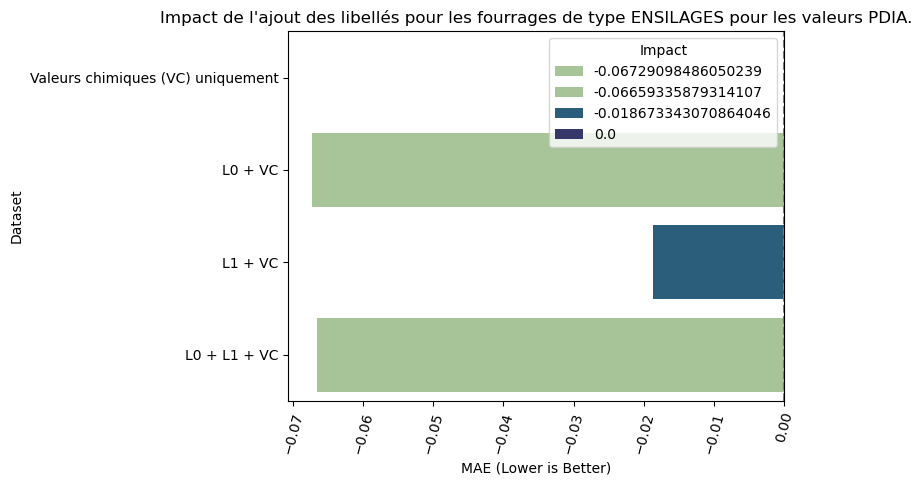

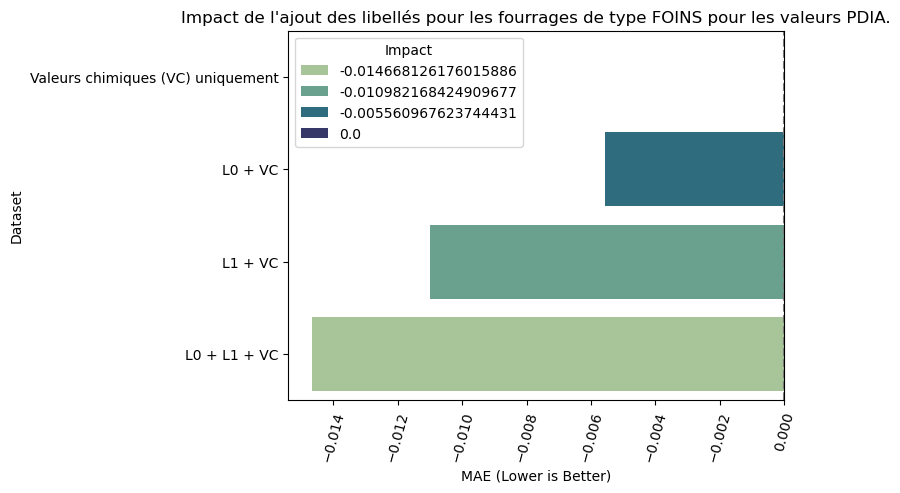

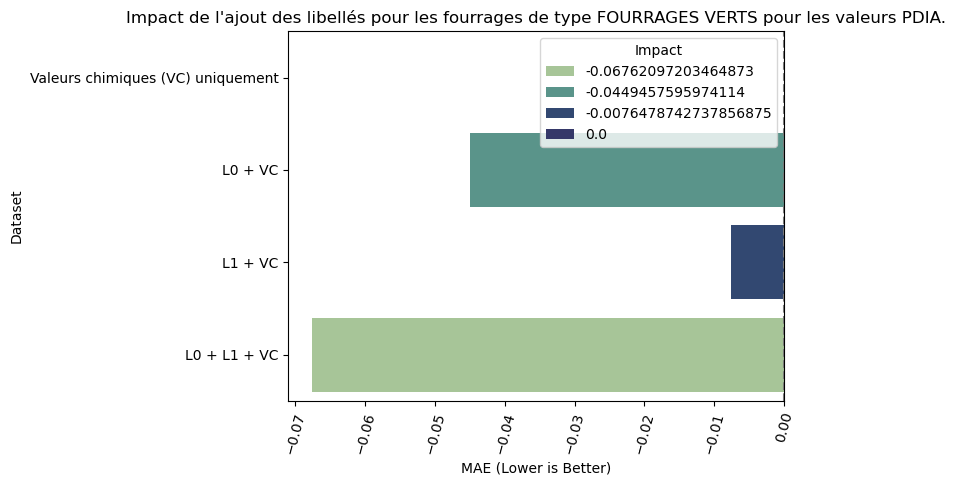

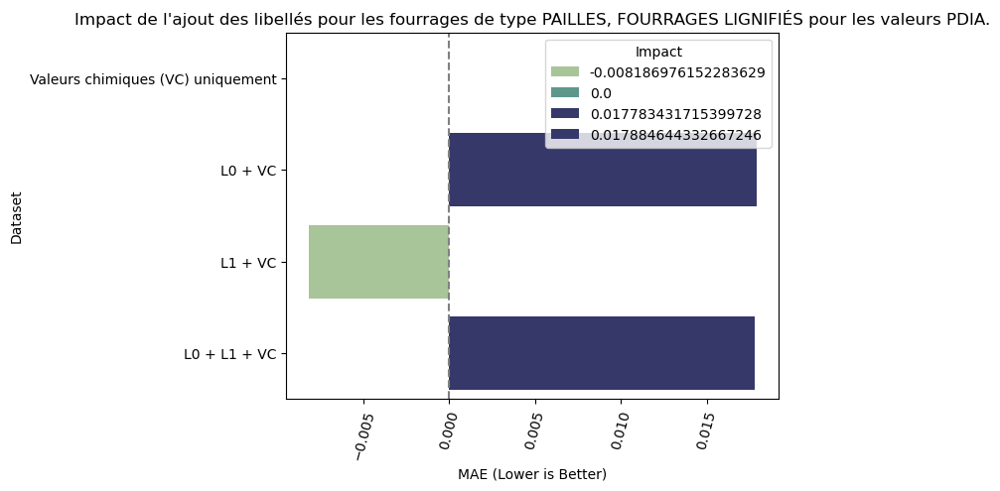

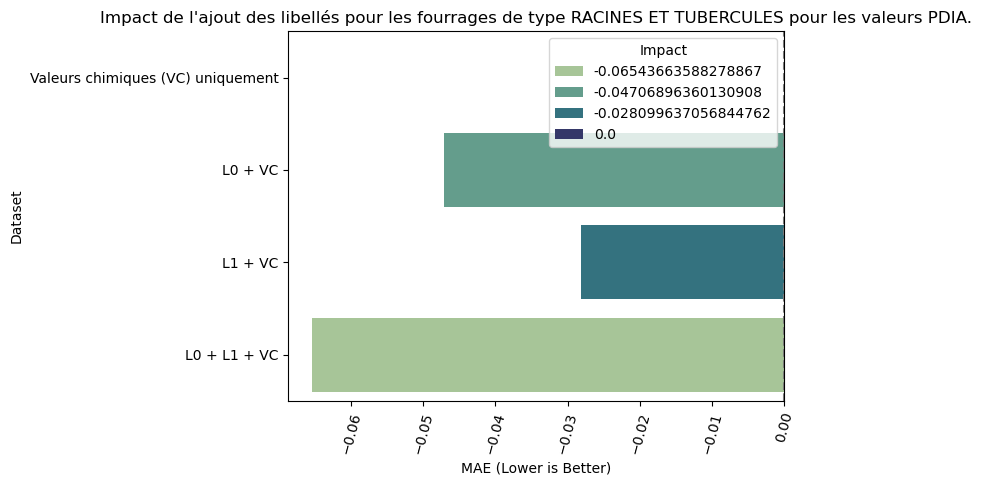

In [ ]:
for libelle in np.unique(obj_features["Libellé 0"]):
    plot_query(baseline_results, "libelle_impact", libelle, "PDIA", "mae", save=False)

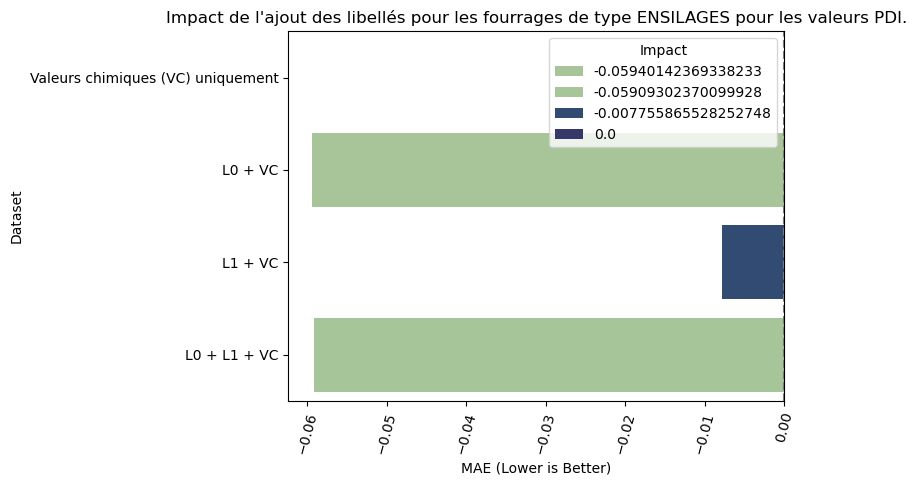

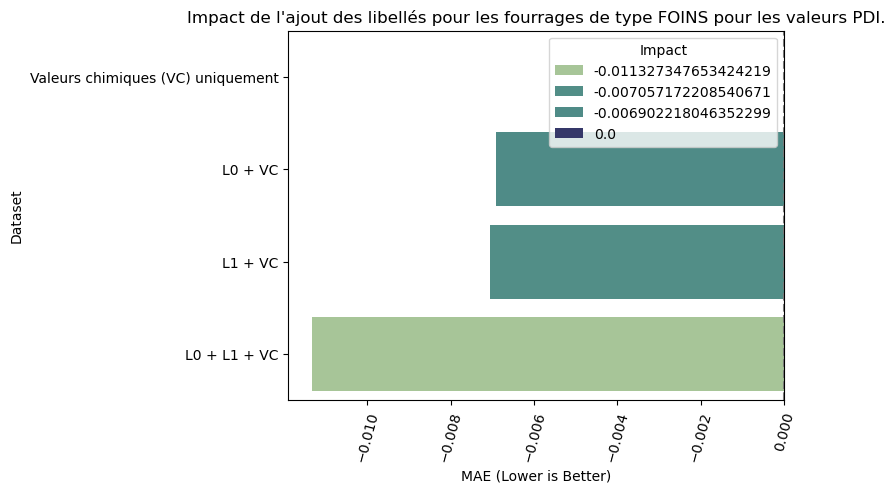

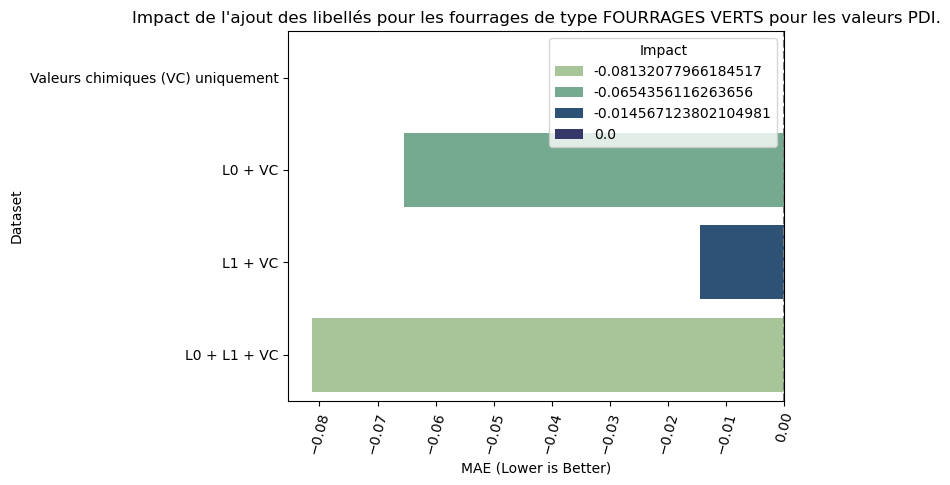

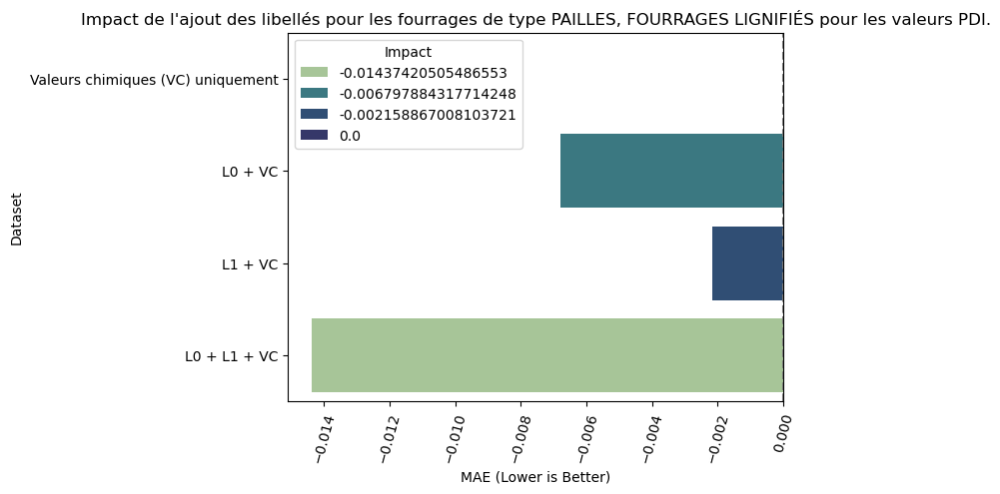

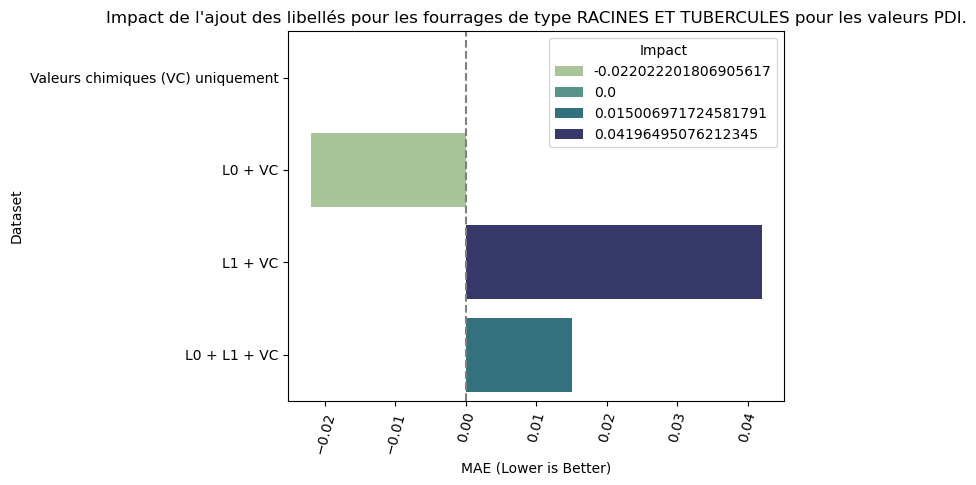

In [ ]:
for libelle in np.unique(obj_features["Libellé 0"]):
    plot_query(baseline_results, "libelle_impact", libelle, "PDI", "mae", save=False)

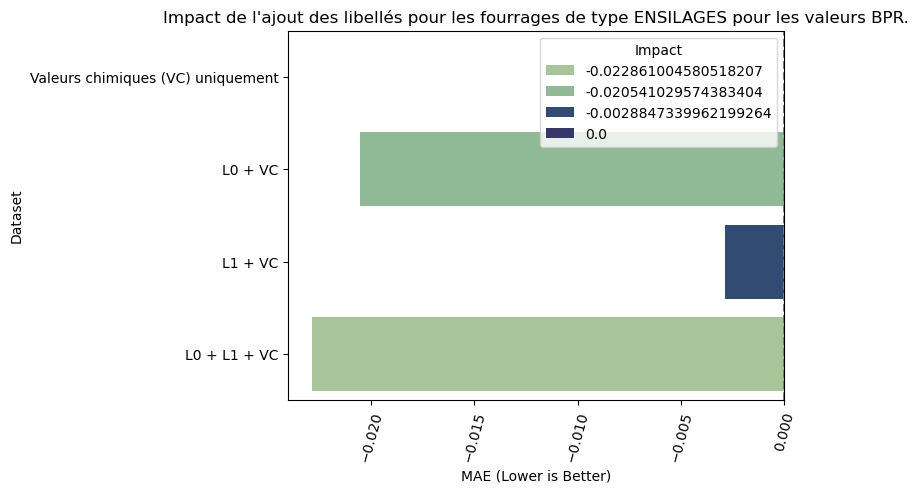

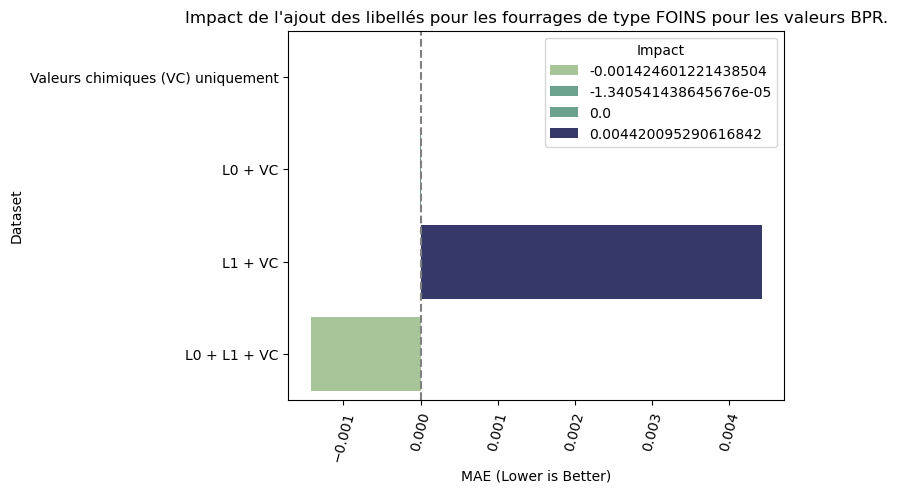

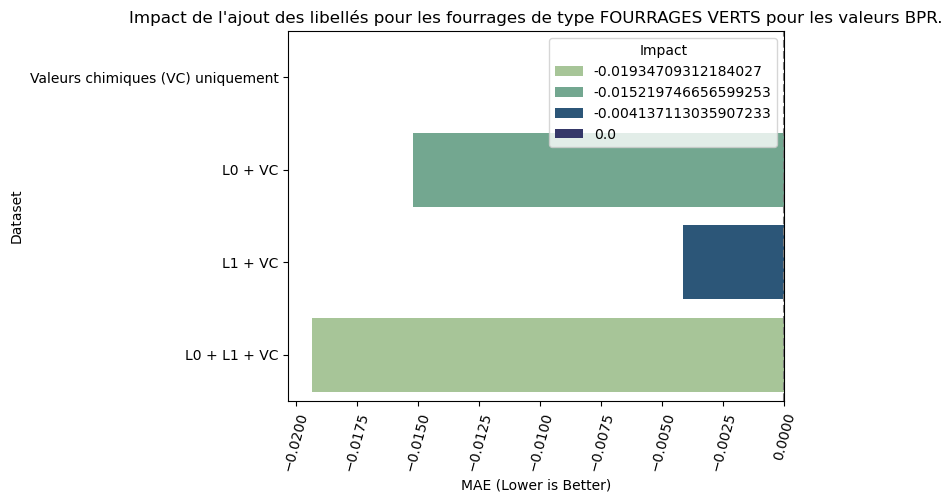

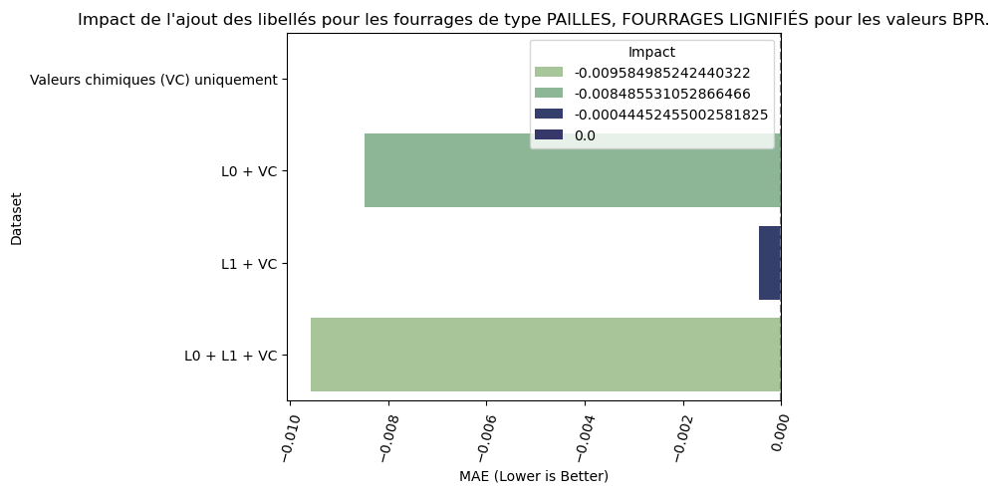

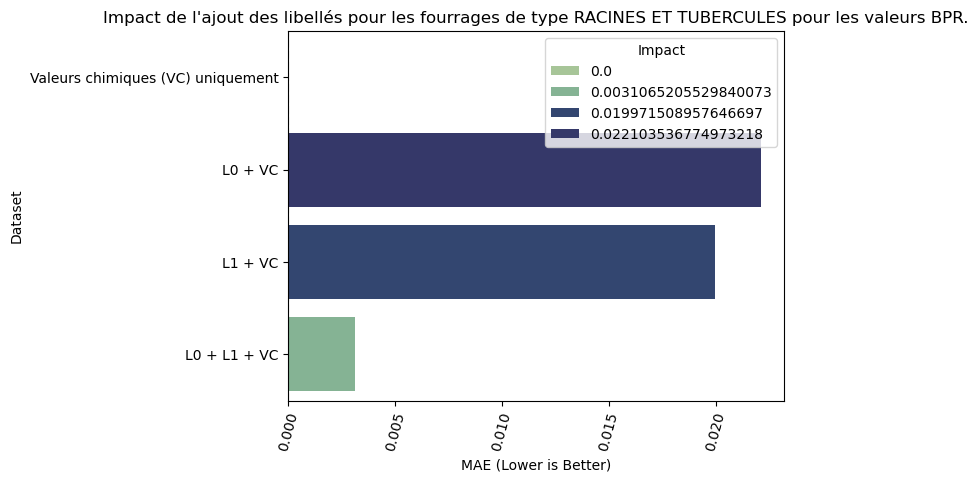

In [ ]:
for libelle in np.unique(obj_features["Libellé 0"]):
    plot_query(baseline_results, "libelle_impact", libelle, "BPR", "mae", save=False)

**Globalement, en regardant par Libellé 0, il semble que les informations textuelles aident très peu.**